<a href="https://colab.research.google.com/github/Martyn0324/MRI-LGAN/blob/Prototypes/VAESequential.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
from torch import nn
from torchvision import transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models # For Fréchet Inception Distance --> The lower, the better

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
class Dataset(torch.utils.data.Dataset):

    def __init__(self, path):

        self.data = torch.load(path)

    def __getitem__(self, idx):

        return self.data[idx]

    def __len__(self):

        return len(self.data)

In [ ]:
dataset = Dataset("/content/drive/MyDrive/ATLAS-master/Processed_Control")

In [ ]:
teste = next(iter(dataset))

In [ ]:
print(teste.size())

torch.Size([160, 256, 256])


In [ ]:
class GenResidualBlock(nn.Module):

    '''
    No use of BatchNorm in the generator in order to avoid random noise in the outputs.
    See ESRGAN paper for further details.
    '''

    def __init__(self, channels, kernel=3, stride=1, padding=1):

        super(GenResidualBlock, self).__init__()

        self.convA = nn.Conv2d(channels, channels, kernel, stride, padding, bias=True)
        self.convB = nn.Conv2d(channels, channels, kernel, stride, padding, bias=True)
        self.convC = nn.Conv2d(channels, channels, kernel, stride, padding, bias=True)

        self.PRelu = nn.PReLU()

    def forward(self, input):

        r1 = input

        x = self.convA(input)
        r2 = self.PRelu(x)

        x = r2 + r1

        x = self.convB(x)
        r3 = self.PRelu(x)

        x = r3 + r2 + r1

        x = self.convC(x)

        output = x + r3 + r2 + r1

        del r1, r2, r3, x

        return output

In [ ]:
class ChannelAttention(nn.Module):

    def __init__(self, channels, kernel):

        super(ChannelAttention, self).__init__()

        self.poolA = nn.AvgPool2d(kernel)
        self.poolB = nn.MaxPool2d(kernel)
        self.filters = nn.Linear(channels, channels, bias=True)

        self.sigmoid = nn.Sigmoid()

    def forward(self, input):

        avg = self.poolA(input) # (B, C, 1, 1)
        max = self.poolB(input) # (B, C, 1, 1)

        weights = max - avg
        weights = weights.view(weights.size(0), -1) # (B, C)

        weights = self.filters(weights)
        weights = self.sigmoid(weights)

        masks = torch.zeros_like(weights)

        for b in range(masks.size(0)):
            for i in range(masks.size(1)):
                if weights[b, i] > 0.5:
                    masks[b, i] = 1.0

        weights = weights * masks
        weights = weights.unsqueeze(-1).unsqueeze(-1) # (B, 64, 1, 1)

        output = input * weights

        return output

In [ ]:
class Encoder(torch.nn.Module):
    '''
    ROBUST ENCODER
    '''

    def __init__(self,):

        super(Encoder, self).__init__()

        self.conv1 = nn.Conv2d(1, 64, 3, 1, 1, bias=False)
        self.channel_attentionA = ChannelAttention(64, 64)
        self.resblock1 = GenResidualBlock(64, 3, 1, 1)
        self.resblock2 = GenResidualBlock(64, 3, 1, 1)
        self.resblock3 = GenResidualBlock(64, 3, 1, 1)
        self.conv2 = nn.Conv2d(64, 128, 2, 2, 0, bias=False)
        self.resblock4 = GenResidualBlock(128, 3, 1, 1)
        self.resblock5 = GenResidualBlock(128, 3, 1, 1)
        self.resblock6 = GenResidualBlock(128, 3, 1, 1)
        self.conv3 = nn.Conv2d(128, 256, 2, 2, 0, bias=False)
        self.resblock7 = GenResidualBlock(256, 3, 1, 1)
        self.resblock8 = GenResidualBlock(256, 3, 1, 1)
        self.resblock9 = GenResidualBlock(256, 3, 1, 1)
        self.conv4 = nn.Conv2d(256, 512, 2, 2, 0, bias=False)
        self.resblock10 = GenResidualBlock(512, 3, 1, 1)
        self.resblock11 = GenResidualBlock(512, 3, 1, 1)
        self.resblock12 = GenResidualBlock(512, 3, 1, 1)
        self.conv5 = nn.Conv2d(512, 1024, 2, 2, 0, bias=False)
        self.resblock13 = GenResidualBlock(1024, 3, 1, 1)
        self.resblock14 = GenResidualBlock(1024, 3, 1, 1)
        self.resblock15 = GenResidualBlock(1024, 3, 1, 1)
        self.channel_attentionB = ChannelAttention(1024, 4)

        self.mean = nn.Linear(4*4*1024, 128, bias=True)
        self.std = nn.Linear(4*4*1024, 128, bias=True)

        self.LRelu = nn.LeakyReLU(0.25)

    def forward(self, input):

        x = self.conv1(input)

        x = self.channel_attentionA(x)

        x = self.resblock1(x)
        x = self.resblock2(x)
        x = self.resblock3(x)
        x = self.LRelu(x)

        x = self.conv2(x)
        x = self.resblock4(x)
        x = self.resblock5(x)
        x = self.resblock6(x)
        x = self.LRelu(x)

        x = self.conv3(x)
        x = self.resblock7(x)
        x = self.resblock8(x)
        x = self.resblock9(x)
        x = self.LRelu(x)

        x = self.conv4(x)
        x = self.resblock10(x)
        x = self.resblock11(x)
        x = self.resblock12(x)
        x = self.LRelu(x)

        x = self.conv5(x)
        x = self.resblock13(x)
        x = self.resblock14(x)
        x = self.resblock15(x)

        x = self.channel_attentionB(x)

        x = x.view(x.size(0), -1)

        mean = self.mean(x)
        std = self.std(x)

        return mean, std

In [ ]:
class Encoder(torch.nn.Module):
    '''
    ROBUST ENCODER --> Sequential Images
    '''

    def __init__(self,):

        super(Encoder, self).__init__()

        # 256 x 256

        self.conv1 = nn.Conv2d(1, 16, 3, 1, 1, bias=False)
        self.resblock1 = GenResidualBlock(16, 3, 1, 1)
        self.resblock2 = GenResidualBlock(16, 3, 1, 1)
        self.resblock3 = GenResidualBlock(16, 3, 1, 1)
        self.conv2 = nn.Conv2d(16, 32, 2, 2, 0, bias=False) # 128x128
        self.resblock4 = GenResidualBlock(32, 3, 1, 1)
        self.resblock5 = GenResidualBlock(32, 3, 1, 1)
        self.resblock6 = GenResidualBlock(32, 3, 1, 1)
        self.conv3 = nn.Conv2d(32, 64, 2, 2, 0, bias=False) # 64x64
        self.resblock7 = GenResidualBlock(64, 3, 1, 1)
        self.resblock8 = GenResidualBlock(64, 3, 1, 1)
        self.resblock9 = GenResidualBlock(64, 3, 1, 1)
        self.conv4 = nn.Conv2d(64, 128, 2, 2, 0, bias=False) # 32x32
        self.resblock10 = GenResidualBlock(128, 3, 1, 1)
        self.resblock11 = GenResidualBlock(128, 3, 1, 1)
        self.resblock12 = GenResidualBlock(128, 3, 1, 1)
        self.conv5 = nn.Conv2d(128, 256, 2, 2, 0, bias=False) # 16x16
        self.resblock13 = GenResidualBlock(256, 3, 1, 1)
        self.resblock14 = GenResidualBlock(256, 3, 1, 1)
        self.resblock15 = GenResidualBlock(256, 3, 1, 1)
        self.conv6 = nn.Conv2d(256, 512, 2, 2, 0, bias=False) # 8x8
        self.resblock16 = GenResidualBlock(512, 3, 1, 1)
        self.resblock17 = GenResidualBlock(512, 3, 1, 1)
        self.resblock18 = GenResidualBlock(512, 3, 1, 1)
        self.conv7 = nn.Conv2d(512, 1024, 2, 2, 0, bias=False) # 4x4
        self.resblock19 = GenResidualBlock(1024, 3, 1, 1)
        self.resblock20 = GenResidualBlock(1024, 3, 1, 1)
        self.resblock21 = GenResidualBlock(1024, 3, 1, 1)

        self.mean = nn.Linear(4*4*1024, 128, bias=True)
        self.std = nn.Linear(4*4*1024, 128, bias=True)

        self.LRelu = nn.LeakyReLU(0.25)

    def forward(self, input):

        # Input = (Batch, Sequence, 256, 256)

        output = []

        for frame in range(input.size(1)):

            x = self.conv1(input[:, frame])
            x = self.resblock1(x)
            x = self.resblock2(x)
            x = self.resblock3(x)
            x = self.LRelu(x)

            x = self.conv2(x)
            x = self.resblock4(x)
            x = self.resblock5(x)
            x = self.resblock6(x)
            x = self.LRelu(x)

            x = self.conv3(x)
            x = self.resblock7(x)
            x = self.resblock8(x)
            x = self.resblock9(x)
            x = self.LRelu(x)

            x = self.conv4(x)
            x = self.resblock10(x)
            x = self.resblock11(x)
            x = self.resblock12(x)
            x = self.LRelu(x)

            x = self.conv5(x)
            x = self.resblock13(x)
            x = self.resblock14(x)
            x = self.resblock15(x)
            x = self.LRelu(x)

            x = self.conv6(x)
            x = self.resblock16(x)
            x = self.resblock17(x)
            x = self.resblock18(x)
            x = self.LRelu(x)

            x = self.conv7(x)
            x = self.resblock19(x)
            x = self.resblock20(x)
            x = self.resblock21(x)
            x = self.LRelu(x)

            x = x.view(x.size(0), -1)

            mean = self.mean(x)
            std = self.std(x)

            output.append((mean, std))

        return output

In [ ]:
class Encoder(torch.nn.Module):
    '''
    ROBUST ENCODER --> Isolated Images
    '''

    def __init__(self,):

        super(Encoder, self).__init__()

        # 256 x 256

        self.conv1 = nn.Conv2d(1, 16, 3, 1, 1, bias=False)
        self.resblock1 = GenResidualBlock(16, 3, 1, 1)
        self.resblock2 = GenResidualBlock(16, 3, 1, 1)
        self.resblock3 = GenResidualBlock(16, 3, 1, 1)
        self.conv2 = nn.Conv2d(16, 32, 2, 2, 0, bias=False) # 128x128
        self.resblock4 = GenResidualBlock(32, 3, 1, 1)
        self.resblock5 = GenResidualBlock(32, 3, 1, 1)
        self.resblock6 = GenResidualBlock(32, 3, 1, 1)
        self.conv3 = nn.Conv2d(32, 64, 2, 2, 0, bias=False) # 64x64
        self.resblock7 = GenResidualBlock(64, 3, 1, 1)
        self.resblock8 = GenResidualBlock(64, 3, 1, 1)
        self.resblock9 = GenResidualBlock(64, 3, 1, 1)
        self.conv4 = nn.Conv2d(64, 128, 2, 2, 0, bias=False) # 32x32
        self.resblock10 = GenResidualBlock(128, 3, 1, 1)
        self.resblock11 = GenResidualBlock(128, 3, 1, 1)
        self.resblock12 = GenResidualBlock(128, 3, 1, 1)
        self.conv5 = nn.Conv2d(128, 256, 2, 2, 0, bias=False) # 16x16
        self.resblock13 = GenResidualBlock(256, 3, 1, 1)
        self.resblock14 = GenResidualBlock(256, 3, 1, 1)
        self.resblock15 = GenResidualBlock(256, 3, 1, 1)
        self.conv6 = nn.Conv2d(256, 512, 2, 2, 0, bias=False) # 8x8
        self.resblock16 = GenResidualBlock(512, 3, 1, 1)
        self.resblock17 = GenResidualBlock(512, 3, 1, 1)
        self.resblock18 = GenResidualBlock(512, 3, 1, 1)
        self.conv7 = nn.Conv2d(512, 1024, 2, 2, 0, bias=False) # 4x4
        self.resblock19 = GenResidualBlock(1024, 3, 1, 1)
        self.resblock20 = GenResidualBlock(1024, 3, 1, 1)
        self.resblock21 = GenResidualBlock(1024, 3, 1, 1)

        self.mean = nn.Linear(4*4*1024, 128, bias=True)
        self.std = nn.Linear(4*4*1024, 128, bias=True)

        self.LRelu = nn.LeakyReLU(0.25)

    def forward(self, input):

        # Input = (Batch, 1, 256, 256)

        x = self.conv1(input)
        x = self.resblock1(x)
        x = self.resblock2(x)
        x = self.resblock3(x)
        x = self.LRelu(x)

        x = self.conv2(x)
        x = self.resblock4(x)
        x = self.resblock5(x)
        x = self.resblock6(x)
        x = self.LRelu(x)

        x = self.conv3(x)
        x = self.resblock7(x)
        x = self.resblock8(x)
        x = self.resblock9(x)
        x = self.LRelu(x)

        x = self.conv4(x)
        x = self.resblock10(x)
        x = self.resblock11(x)
        x = self.resblock12(x)
        x = self.LRelu(x)

        x = self.conv5(x)
        x = self.resblock13(x)
        x = self.resblock14(x)
        x = self.resblock15(x)
        x = self.LRelu(x)

        x = self.conv6(x)
        x = self.resblock16(x)
        x = self.resblock17(x)
        x = self.resblock18(x)
        x = self.LRelu(x)

        x = self.conv7(x)
        x = self.resblock19(x)
        x = self.resblock20(x)
        x = self.resblock21(x)
        x = self.LRelu(x)

        x = x.view(x.size(0), -1)

        mean = self.mean(x)
        std = self.std(x)

        return mean, std

In [ ]:
class Decoder(torch.nn.Module):

    '''
    ROBUST DECODER
    '''

    def __init__(self,):

        super(Decoder, self).__init__()

        self.transconv1 = nn.ConvTranspose2d(128, 1024, 4, 1, 0, bias=False) # 4x4
        self.channel_attentionA = ChannelAttention(1024, 4)
        self.resblock1 = GenResidualBlock(1024, 3, 1, 1)
        self.resblock2 = GenResidualBlock(1024, 3, 1, 1)
        self.resblock3 = GenResidualBlock(1024, 3, 1, 1)
        self.conv2 = nn.Conv2d(1024, 512, 3, 1, 1, bias=False) # 8x8
        self.resblock4 = GenResidualBlock(512, 3, 1, 1)
        self.resblock5 = GenResidualBlock(512, 3, 1, 1)
        self.resblock6 = GenResidualBlock(512, 3, 1, 1)
        self.conv3 = nn.Conv2d(512, 256, 3, 1, 1, bias=False) # 16x16
        self.resblock7 = GenResidualBlock(256, 3, 1, 1)
        self.resblock8 = GenResidualBlock(256, 3, 1, 1)
        self.resblock9 = GenResidualBlock(256, 3, 1, 1)
        self.conv4 = nn.Conv2d(256, 128, 3, 1, 1, bias=False) # 32x32
        self.resblock10 = GenResidualBlock(128, 3, 1, 1)
        self.resblock11 = GenResidualBlock(128, 3, 1, 1)
        self.resblock12 = GenResidualBlock(128, 3, 1, 1)
        self.conv5 = nn.Conv2d(128, 64, 3, 1, 1, bias=False) # 64x64
        self.channel_attentionB = ChannelAttention(64, 64)
        self.resblock13 = GenResidualBlock(64, 3, 1, 1)
        self.resblock14 = GenResidualBlock(64, 3, 1, 1)
        self.resblock15 = GenResidualBlock(64, 3, 1, 1)
        self.conv6 = nn.Conv2d(64, 1, 3, 1, 1, bias=True)
        self.resblock16 = GenResidualBlock(1, 3, 1, 1)
        self.resblock17 = GenResidualBlock(1, 3, 1, 1)
        self.resblock18 = GenResidualBlock(1, 3, 1, 1)

        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')
        self.LRelu = nn.LeakyReLU(0.25)
        self.sigmoid = nn.Sigmoid()

        self.scale = nn.Parameter(torch.tensor([0.0]))

    def forward(self, input):

        x = input.unsqueeze(-1).unsqueeze(-1)

        x = self.transconv1(x)

        x = self.channel_attentionA(x)

        x = self.resblock1(x)
        x = self.resblock2(x)
        x = self.resblock3(x)
        x = self.LRelu(x)

        x = self.upsample(x)
        x = self.conv2(x)
        x = self.resblock4(x)
        x = self.resblock5(x)
        x = self.resblock6(x)
        x = self.LRelu(x)

        x = self.upsample(x)
        x = self.conv3(x)
        x = self.resblock7(x)
        x = self.resblock8(x)
        x = self.resblock9(x)
        x = self.LRelu(x)

        x = self.upsample(x)
        x = self.conv4(x)
        x = self.resblock10(x)
        x = self.resblock11(x)
        x = self.resblock12(x)
        x = self.LRelu(x)

        x = self.upsample(x)
        x = self.conv5(x)

        x = self.channel_attentionB(x)

        x = self.resblock13(x)
        x = self.resblock14(x)
        x = self.resblock15(x)
        x = self.LRelu(x)

        x = self.conv6(x)
        x = self.resblock16(x)
        x = self.resblock17(x)
        x = self.resblock18(x)

        output = self.sigmoid(x)

        return output

In [ ]:
class Decoder(torch.nn.Module):

    '''
    ROBUST DECODER --- Isolated Images
    '''

    def __init__(self,):

        super(Decoder, self).__init__()

        self.transconv1 = nn.ConvTranspose2d(128, 1024, 4, 1, 0, bias=False) # 4x4
        self.resblock1 = GenResidualBlock(1024, 3, 1, 1)
        self.resblock2 = GenResidualBlock(1024, 3, 1, 1)
        self.resblock3 = GenResidualBlock(1024, 3, 1, 1)
        self.conv2 = nn.Conv2d(1024, 512, 3, 1, 1, bias=False) # 8x8
        self.resblock4 = GenResidualBlock(512, 3, 1, 1)
        self.resblock5 = GenResidualBlock(512, 3, 1, 1)
        self.resblock6 = GenResidualBlock(512, 3, 1, 1)
        self.conv3 = nn.Conv2d(512, 256, 3, 1, 1, bias=False) # 16x16
        self.resblock7 = GenResidualBlock(256, 3, 1, 1)
        self.resblock8 = GenResidualBlock(256, 3, 1, 1)
        self.resblock9 = GenResidualBlock(256, 3, 1, 1)
        self.conv4 = nn.Conv2d(256, 128, 3, 1, 1, bias=False) # 32x32
        self.resblock10 = GenResidualBlock(128, 3, 1, 1)
        self.resblock11 = GenResidualBlock(128, 3, 1, 1)
        self.resblock12 = GenResidualBlock(128, 3, 1, 1)
        self.conv5 = nn.Conv2d(128, 64, 3, 1, 1, bias=False) # 64x64
        self.resblock13 = GenResidualBlock(64, 3, 1, 1)
        self.resblock14 = GenResidualBlock(64, 3, 1, 1)
        self.resblock15 = GenResidualBlock(64, 3, 1, 1)
        self.conv6 = nn.Conv2d(64, 32, 3, 1, 1, bias=True) # 128x128
        self.resblock16 = GenResidualBlock(32, 3, 1, 1)
        self.resblock17 = GenResidualBlock(32, 3, 1, 1)
        self.resblock18 = GenResidualBlock(32, 3, 1, 1)
        self.conv7 = nn.Conv2d(32, 16, 3, 1, 1, bias=True) # 256x256
        self.resblock19 = GenResidualBlock(16, 3, 1, 1)
        self.resblock20 = GenResidualBlock(16, 3, 1, 1)
        self.resblock21 = GenResidualBlock(16, 3, 1, 1)
        self.conv8 = nn.Conv2d(16, 1, 3, 1, 1, bias=True) # 256x256
        self.resblock22 = GenResidualBlock(1, 3, 1, 1)
        self.resblock23 = GenResidualBlock(1, 3, 1, 1)
        self.resblock24 = GenResidualBlock(1, 3, 1, 1)

        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')
        self.LRelu = nn.LeakyReLU(0.25)
        self.sigmoid = nn.Sigmoid()

        self.scale = nn.Parameter(torch.tensor([0.0]))

    def forward(self, input):

        x = input.unsqueeze(-1).unsqueeze(-1) # (Batch, 128, 1, 1)

        x = self.transconv1(x)
        x = self.resblock1(x)
        x = self.resblock2(x)
        x = self.resblock3(x)
        x = self.LRelu(x)

        x = self.upsample(x)
        x = self.conv2(x)
        x = self.resblock4(x)
        x = self.resblock5(x)
        x = self.resblock6(x)
        x = self.LRelu(x)

        x = self.upsample(x)
        x = self.conv3(x)
        x = self.resblock7(x)
        x = self.resblock8(x)
        x = self.resblock9(x)
        x = self.LRelu(x)

        x = self.upsample(x)
        x = self.conv4(x)
        x = self.resblock10(x)
        x = self.resblock11(x)
        x = self.resblock12(x)
        x = self.LRelu(x)

        x = self.upsample(x)
        x = self.conv5(x)
        x = self.LRelu(x)
        x = self.resblock13(x)
        x = self.resblock14(x)
        x = self.resblock15(x)
        x = self.LRelu(x)

        x = self.upsample(x)
        x = self.conv6(x)
        x = self.LRelu(x)
        x = self.resblock16(x)
        x = self.resblock17(x)
        x = self.resblock18(x)
        x = self.LRelu(x)

        x = self.upsample(x)
        x = self.conv7(x)
        x = self.LRelu(x)
        x = self.resblock19(x)
        x = self.resblock20(x)
        x = self.resblock21(x)
        x = self.LRelu(x)

        x = self.conv8(x)
        #x = self.LRelu(x)
        x = self.resblock22(x)
        x = self.resblock23(x)
        x = self.resblock24(x)

        output = self.sigmoid(x) # (Batch, 1, 256, 256)

        return output

In [ ]:
class Decoder(torch.nn.Module):

    '''
    ROBUST DECODER --- Sequence of images
    '''

    def __init__(self,):

        super(Decoder, self).__init__()

        self.transconv1 = nn.ConvTranspose2d(128, 1024, 4, 1, 0, bias=False) # 4x4
        self.resblock1 = GenResidualBlock(1024, 3, 1, 1)
        self.resblock2 = GenResidualBlock(1024, 3, 1, 1)
        self.resblock3 = GenResidualBlock(1024, 3, 1, 1)
        self.conv2 = nn.Conv2d(1024, 512, 3, 1, 1, bias=False) # 8x8
        self.resblock4 = GenResidualBlock(512, 3, 1, 1)
        self.resblock5 = GenResidualBlock(512, 3, 1, 1)
        self.resblock6 = GenResidualBlock(512, 3, 1, 1)
        self.conv3 = nn.Conv2d(512, 256, 3, 1, 1, bias=False) # 16x16
        self.resblock7 = GenResidualBlock(256, 3, 1, 1)
        self.resblock8 = GenResidualBlock(256, 3, 1, 1)
        self.resblock9 = GenResidualBlock(256, 3, 1, 1)
        self.conv4 = nn.Conv2d(256, 128, 3, 1, 1, bias=False) # 32x32
        self.resblock10 = GenResidualBlock(128, 3, 1, 1)
        self.resblock11 = GenResidualBlock(128, 3, 1, 1)
        self.resblock12 = GenResidualBlock(128, 3, 1, 1)
        self.conv5 = nn.Conv2d(128, 64, 3, 1, 1, bias=False) # 64x64
        self.resblock13 = GenResidualBlock(64, 3, 1, 1)
        self.resblock14 = GenResidualBlock(64, 3, 1, 1)
        self.resblock15 = GenResidualBlock(64, 3, 1, 1)
        self.conv6 = nn.Conv2d(64, 32, 3, 1, 1, bias=True) # 128x128
        self.resblock16 = GenResidualBlock(32, 3, 1, 1)
        self.resblock17 = GenResidualBlock(32, 3, 1, 1)
        self.resblock18 = GenResidualBlock(32, 3, 1, 1)
        self.conv7 = nn.Conv2d(32, 16, 3, 1, 1, bias=True) # 256x256
        self.resblock19 = GenResidualBlock(16, 3, 1, 1)
        self.resblock20 = GenResidualBlock(16, 3, 1, 1)
        self.resblock21 = GenResidualBlock(16, 3, 1, 1)
        self.conv8 = nn.Conv2d(16, 1, 3, 1, 1, bias=True) # 256x256
        self.resblock22 = GenResidualBlock(1, 3, 1, 1)
        self.resblock23 = GenResidualBlock(1, 3, 1, 1)
        self.resblock24 = GenResidualBlock(1, 3, 1, 1)

        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')
        self.LRelu = nn.LeakyReLU(0.25)
        self.sigmoid = nn.Sigmoid()

        self.scale = nn.Parameter(torch.tensor([0.0]))

    def forward(self, input):

        output = []

        for frame in range(len(input)):

            x = input[frame].unsqueeze(-1).unsqueeze(-1) # (Batch, 128, 1, 1)

            x = self.transconv1(x)
            x = self.resblock1(x)
            x = self.resblock2(x)
            x = self.resblock3(x)
            x = self.LRelu(x)

            x = self.upsample(x)
            x = self.conv2(x)
            x = self.resblock4(x)
            x = self.resblock5(x)
            x = self.resblock6(x)
            x = self.LRelu(x)

            x = self.upsample(x)
            x = self.conv3(x)
            x = self.resblock7(x)
            x = self.resblock8(x)
            x = self.resblock9(x)
            x = self.LRelu(x)

            x = self.upsample(x)
            x = self.conv4(x)
            x = self.resblock10(x)
            x = self.resblock11(x)
            x = self.resblock12(x)
            x = self.LRelu(x)

            x = self.upsample(x)
            x = self.conv5(x)
            x = self.LRelu(x)
            x = self.resblock13(x)
            x = self.resblock14(x)
            x = self.resblock15(x)
            x = self.LRelu(x)

            x = self.upsample(x)
            x = self.conv6(x)
            x = self.LRelu(x)
            x = self.resblock16(x)
            x = self.resblock17(x)
            x = self.resblock18(x)
            x = self.LRelu(x)

            x = self.upsample(x)
            x = self.conv7(x)
            x = self.LRelu(x)
            x = self.resblock19(x)
            x = self.resblock20(x)
            x = self.resblock21(x)
            x = self.LRelu(x)

            x = self.conv8(x)
            #x = self.LRelu(x)
            x = self.resblock22(x)
            x = self.resblock23(x)
            x = self.resblock24(x)

            x = self.sigmoid(x) # (Batch, 1, 256, 256)

            output.append(x)

        output = torch.cat(output, 1) # (Batch, Sequence, 256, 256)

        return output

In [ ]:
class ImageDiscriminator(nn.Module):
    '''
    Latent Diffusion paper used a Discriminator that returned a mask,
    classifying pixels between real or fake.

    ESRGAN used a Relativistic Discriminator, which seems to help with stability.

    Stability, however, is not really an issue with VAEGAN.
    '''

    def __init__(self):
        super(ImageDiscriminator, self).__init__()

        # Downsample
        self.conv1A = nn.Conv2d(1, 16, 3, 1, 1, bias=False)
        self.conv2A = nn.Conv2d(16, 32, 2, 2, 0, bias=False) # 128x128
        self.conv2B = nn.Conv2d(32, 32, 3, 1, 1, bias=True)
        self.conv2C = nn.Conv2d(32, 32, 3, 1, 1, bias=True)
        self.conv3A = nn.Conv2d(32, 64, 2, 2, 0, bias=False) # 64x64
        self.conv3B = nn.Conv2d(64, 64, 3, 1, 1, bias=True)
        self.conv3C = nn.Conv2d(64, 64, 3, 1, 1, bias=True)
        self.conv4A = nn.Conv2d(64, 128, 2, 2, 0, bias=False) # 32x32
        self.conv4B = nn.Conv2d(128, 128, 3, 1, 1, bias=True)
        self.conv4C = nn.Conv2d(128, 128, 3, 1, 1, bias=True)
        self.conv5A = nn.Conv2d(128, 256, 2, 2, 0, bias=False) # 16x16
        self.conv5B = nn.Conv2d(256, 256, 3, 1, 1, bias=True)
        self.conv5C = nn.Conv2d(256, 256, 3, 1, 1, bias=True)
        self.conv6A = nn.Conv2d(256, 512, 2, 2, 0, bias=False) # 8x8
        self.conv6B = nn.Conv2d(512, 512, 3, 1, 1, bias=True)
        self.conv6C = nn.Conv2d(512, 512, 3, 1, 1, bias=True)
        # Upsample
        self.conv7A = nn.Conv2d(512, 256, 3, 1, 1, bias=False) # 16x16
        self.conv7B = nn.Conv2d(256, 256, 3, 1, 1, bias=True)
        self.conv7C = nn.Conv2d(256, 256, 3, 1, 1, bias=True)
        self.conv8A = nn.Conv2d(256, 128, 3, 1, 1, bias=False) # 32x32
        self.conv8B = nn.Conv2d(128, 128, 3, 1, 1, bias=True)
        self.conv8C = nn.Conv2d(128, 128, 3, 1, 1, bias=True)
        self.conv9A = nn.Conv2d(128, 64, 3, 1, 1, bias=False) # 64x64
        self.conv9B = nn.Conv2d(64, 64, 3, 1, 1, bias=True)
        self.conv9C = nn.Conv2d(64, 64, 3, 1, 1, bias=True)
        self.conv10A = nn.Conv2d(64, 32, 3, 1, 1, bias=False) # 128x128
        self.conv10B = nn.Conv2d(32, 32, 3, 1, 1, bias=True)
        self.conv10C = nn.Conv2d(32, 32, 3, 1, 1, bias=True)
        self.conv11A = nn.Conv2d(32, 16, 3, 1, 1, bias=False) # 256x256
        self.conv11B = nn.Conv2d(16, 16, 3, 1, 1, bias=True)
        self.conv11C = nn.Conv2d(16, 16, 3, 1, 1, bias=True)
        self.conv_out = nn.Conv2d(16, 1, 3, 1, 1, bias=True)

        self.LRelu = nn.LeakyReLU(0.2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')
        self.sigmoid = nn.Sigmoid()

    def forward(self, input):

        x = self.conv1A(input)
        r1 = self.LRelu(x)

        x = self.conv2A(r1) # 128x128
        x = self.LRelu(x)
        x = self.conv2B(x)
        x = self.LRelu(x)
        x = self.conv2C(x)
        r2 = self.LRelu(x)

        x = self.conv3A(r2) # 64x64
        x = self.LRelu(x)
        x = self.conv3B(x)
        x = self.LRelu(x)
        x = self.conv3C(x)
        r3 = self.LRelu(x)

        x = self.conv4A(r3) # 32x32
        x = self.LRelu(x)
        x = self.conv4B(x)
        x = self.LRelu(x)
        x = self.conv4C(x)
        r4 = self.LRelu(x)

        x = self.conv5A(r4) # 16x16
        x = self.LRelu(x)
        x = self.conv5B(x)
        x = self.LRelu(x)
        x = self.conv5C(x)
        r5 = self.LRelu(x)

        x = self.conv6A(r5) # 8x8
        x = self.LRelu(x)
        x = self.conv6B(x)
        x = self.LRelu(x)
        x = self.conv6C(x)
        x = self.LRelu(x)

        x = self.upsample(x) # 16x16
        x = self.conv7A(x)
        x = x + r5
        x = self.conv7B(x)
        x = self.LRelu(x)
        x = self.conv7C(x)
        x = self.LRelu(x)

        x = self.upsample(x) # 32x32
        x = self.conv8A(x)
        x = x + r4
        x = self.conv8B(x)
        x = self.LRelu(x)
        x = self.conv8C(x)
        x = self.LRelu(x)

        x = self.upsample(x) # 64x64
        x = self.conv9A(x)
        x = x + r3
        x = self.conv9B(x)
        x = self.LRelu(x)
        x = self.conv9C(x)
        x = self.LRelu(x)

        x = self.upsample(x) # 128x128
        x = self.conv10A(x)
        x = x + r2
        x = self.conv10B(x)
        x = self.LRelu(x)
        x = self.conv10C(x)
        x = self.LRelu(x)

        x = self.upsample(x) # 256x256
        x = self.conv11A(x)
        x = x + r1
        x = self.conv11B(x)
        x = self.LRelu(x)
        x = self.conv11C(x)
        x = self.LRelu(x)

        x = self.conv_out(x)
        output = self.sigmoid(x) # (Batch, 1, 256, 256)

        return output

In [ ]:
import math

def get_positional_encoding(d_model, max_length=100):
    """
    Computes positional encoding as defined in the Transformer's Paper.
    :param d_model: size of vectors throughout the transformer model ---> 128
    :param max_length: maximum sequence length up to which positional encodings must be calculated ---> 160
    :return: positional encoding, a tensor of size (1, max_length, d_model)
    """
    positional_encoding = torch.zeros((max_length, d_model))  # (max_length, d_model)
    for i in range(max_length):
        for j in range(d_model):
            if j % 2 == 0:
                positional_encoding[i, j] = math.sin(i / math.pow(10000, j / d_model))
            else:
                positional_encoding[i, j] = math.cos(i / math.pow(10000, (j - 1) / d_model))

    positional_encoding = positional_encoding.unsqueeze(0)  # (1, max_length, d_model)

    return positional_encoding

In [ ]:
class DiscriminatorSequence(nn.Module):
    '''
    Latent Diffusion paper used a Discriminator that returned a mask,
    classifying pixels between real or fake.

    ESRGAN used a Relativistic Discriminator, which seems to help with stability.

    Stability, however, is not really an issue with VAEGAN.
    '''

    def __init__(self, sequence_length):
        super(DiscriminatorSequence, self).__init__()

        # 256x256

        self.conv1A = nn.Conv2d(sequence_length, sequence_length*4, 3, 3, 1, bias=False)
        self.conv2A = nn.Conv2d(sequence_length*4, sequence_length, 64, 8, 1, bias=False) # 25x25
        self.conv2B = nn.Conv2d(sequence_length, sequence_length, 3, 1, 1, bias=True)
        self.conv2C = nn.Conv2d(sequence_length, sequence_length, 3, 1, 1, bias=True)
        self.conv3A = nn.Conv2d(sequence_length, sequence_length//4, 5, 2, 1, bias=False) # 12x12
        self.conv3B = nn.Conv2d(sequence_length//4, sequence_length//4, 3, 1, 1, bias=True)
        self.conv3C = nn.Conv2d(sequence_length//4, sequence_length//4, 3, 1, 1, bias=True)
        self.conv4A = nn.Conv2d(sequence_length//4, sequence_length//8, 3, 2, 1, bias=False) # 6x6
        self.conv4B = nn.Conv2d(sequence_length//8, sequence_length//8, 3, 1, 1, bias=True)
        self.conv4C = nn.Conv2d(sequence_length//8, sequence_length//8, 3, 1, 1, bias=True)

        self.neuronA = nn.Linear(6*6*sequence_length//8, 1024, bias=True)
        self.neuron_out = nn.Linear(1024, 1, bias=True)

        self.LRelu = nn.LeakyReLU(0.2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')
        self.sigmoid = nn.Sigmoid()

    def forward(self, input):

        # Input (Batch, Sequence, 256, 256)

        x = self.conv1A(input)
        x = self.LRelu(x)

        x = self.conv2A(x)
        x = self.LRelu(x)
        x = self.conv2B(x)
        x = self.conv2C(x)
        x = self.LRelu(x)

        x = self.conv3A(x)
        x = self.LRelu(x)
        x = self.conv3B(x)
        x = self.conv3C(x)
        x = self.LRelu(x)

        x = self.conv4A(x)
        x = self.LRelu(x)
        x = self.conv4B(x)
        x = self.conv4C(x)
        x = self.LRelu(x)

        x = x.view(x.size(0), -1)

        x = self.neuronA(x)
        x = self.LRelu(x)
        x = self.neuron_out(x)
        output = self.sigmoid(x)

        return output

In [ ]:
encoder = Encoder().to(device)
decoder = Decoder().to(device)
image_discriminator = ImageDiscriminator().to(device)
#fps_discriminator = DiscriminatorSequence(160).to(device)

In [ ]:
def kl_divergence(z, mu, std):
    '''
    Using This KLD is better since we'll be passing random noise
    generated from a Normal Distribution to the GAN (after training VAE)
    '''
    # --------------------------
    # Monte carlo KL divergence
    # --------------------------
    # 1. define the first two probabilities (in this case Normal for both)
    p = torch.distributions.Normal(torch.zeros_like(mu), torch.ones_like(std))
    q = torch.distributions.Normal(mu, std)

    # 2. get the probabilities from the equation
    log_qzx = q.log_prob(z)
    log_pz = p.log_prob(z)

    # kl
    kl = (log_qzx - log_pz)
    kl = kl.sum(-1)
    return kl

In [ ]:
def gaussian_likelihood(mean, scale, sample):
    scale = torch.exp(scale)
    dist = torch.distributions.Normal(mean, scale)
    log_pxz = dist.log_prob(sample)
    return log_pxz.sum(dim=(1, 2, 3))

In [ ]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=64, shuffle=True)

optimizere = torch.optim.Adam(encoder.parameters(), lr=1e-6)
optimizerd = torch.optim.Adam(decoder.parameters(), lr=1e-6)
optimizer_image = torch.optim.Adam(image_discriminator.parameters(), lr=1e-6)
#optimizer_fps = torch.optim.Adam(fps_discriminator.parameters(), lr=1e-4)

content_loss = nn.MSELoss()
bce = nn.BCELoss()

# Latent Diffusion paper didn't use the metric "epochs", but iterations,
# probably due to high computation time. Let's do the same.
# Forget the epochs, let's go with iterations.

#epoch = 0
#EPOCHS = 1000
iter = 0
ITERATIONS = 200000

In [ ]:
params = torch.load('/content/drive/MyDrive/Colab Notebooks/VAEGAN_parameters.tar')

iter = params['iter']
encoder.load_state_dict(params['Encoder_weights'])
decoder.load_state_dict(params['Decoder_weights'])
image_discriminator.load_state_dict(params['Discriminator_weights'])
#fps_discriminator.load_state_dict(params['DiscriminatorFPS_weights'])

del params

In [ ]:
class Inception(nn.Module):

    '''
    Calculating FID
    '''

    def __init__(self):

        super(Inception, self).__init__()

        self.pad = nn.ConstantPad2d((128-64)//2, 0)

        self.imagenet_mean = torch.FloatTensor([0.485, 0.456, 0.406]).to(device).unsqueeze(0).unsqueeze(2).unsqueeze(3)
        self.imagenet_std_cuda = torch.FloatTensor([0.229, 0.224, 0.225]).to(device).unsqueeze(0).unsqueeze(2).unsqueeze(3)

        self.inception = models.inception_v3(weights=models.Inception_V3_Weights.DEFAULT)
        self.inception.eval()

    def forward(self, input):

        # Since Inception-V3 was trained on ImageNet, it's necessary to normalize our data using ImageNet stats

        if input.ndimension() == 3:
            input = (input - self.imagenet_mean) / self.imagenet_std_cuda
        elif input.ndimension() == 4:
            input = (input - self.imagenet_mean) / self.imagenet_std_cuda

        output = self.inception(self.pad(input))

        return output

In [ ]:
inception = Inception().to(device).eval()

def get_FID(real_images, generated_images):

    with torch.no_grad():

        features_real, features_fake = inception(real_images), inception(generated_images)

    mean_real, mean_fake = torch.mean(features_real), torch.mean(features_fake)

    cov_real, cov_fake = torch.cov(features_real), torch.cov(features_fake)

    diff = (cov_real * cov_fake)**1/2

    trace = (cov_real + cov_fake - 2*diff)

    FID_score = (mean_real - mean_fake)**2 + torch.trace(trace)
    FID_score = FID_score/real_images.size(0)

    return abs(FID_score)

100/200000
Discriminator Loss: 1.3856308329105378
Encoding Loss: 63245.36328125	Decoding Loss: -97350.0625
VAE ELBo: 49364397.68789063
VAEGAN Loss: 49364398.33734375
Encoder grads: 27483.86328125	Decoder grads: -0.002203911542892456
Discriminator grads: -0.0002171607775380835
Decoded Images MEAN: 0.4899798333644867	STD: 0.17400000989437103


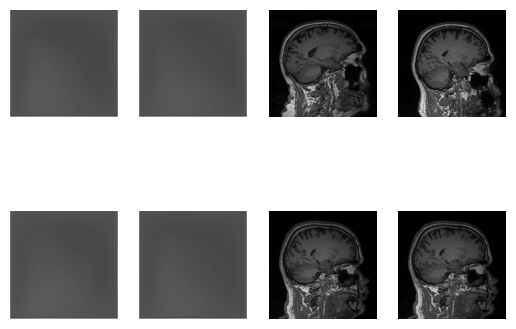

200/200000
Discriminator Loss: 0.27692542016506194
Encoding Loss: 25382.47265625	Decoding Loss: -88983.7734375
VAE ELBo: 29948.5141015625
VAEGAN Loss: 29948.645703125
Encoder grads: 11674.017578125	Decoder grads: 0.14601121842861176
Discriminator grads: 0.00025125444517470896
Decoded Images MEAN: 0.21605125069618225	STD: 0.35832643508911133


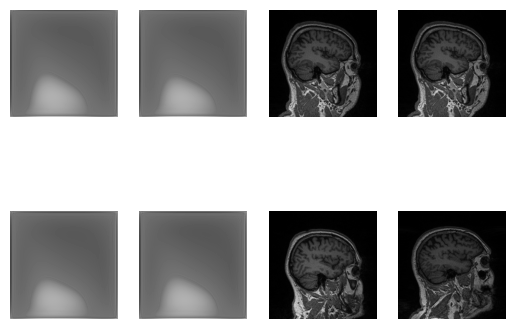

300/200000
Discriminator Loss: 0.6460243320465088
Encoding Loss: 19776.263671875	Decoding Loss: -86808.359375
VAE ELBo: 61211.839270833334
VAEGAN Loss: 61212.14760416667
Encoder grads: 17632.814453125	Decoder grads: 0.11240744590759277
Discriminator grads: 5.471186523209326e-05
Decoded Images MEAN: 0.2895224988460541	STD: 0.40494778752326965


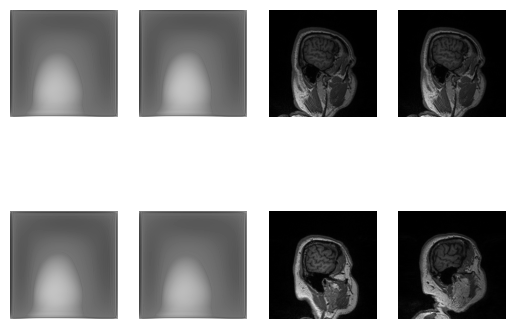

400/200000
Discriminator Loss: 0.27662139654159545
Encoding Loss: 29269.138671875	Decoding Loss: -87212.4921875
VAE ELBo: 24801.70857421875
VAEGAN Loss: 24801.841015625
Encoder grads: 6709.5537109375	Decoder grads: -0.0307726189494133
Discriminator grads: 0.00012679491192102432
Decoded Images MEAN: 0.24571840465068817	STD: 0.40543749928474426


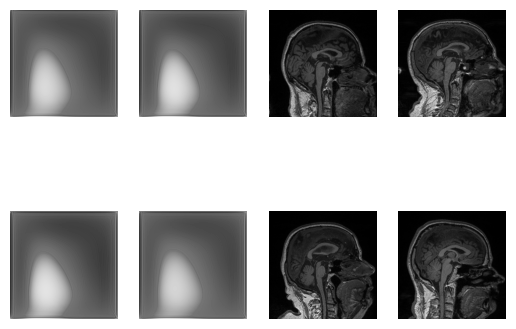

500/200000
Discriminator Loss: 0.05526970911026001
Encoding Loss: 20473.224609375	Decoding Loss: -87591.3125
VAE ELBo: 5224.80509375
VAEGAN Loss: 5224.83171875
Encoder grads: 14834.9658203125	Decoder grads: -0.10442949831485748
Discriminator grads: -1.1444790288805962e-06
Decoded Images MEAN: 0.39030566811561584	STD: 0.46118196845054626


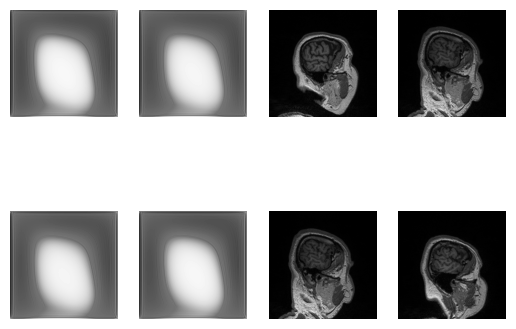

600/200000
Discriminator Loss: 0.27629495481650035
Encoding Loss: 11446.4130859375	Decoding Loss: -87066.515625
VAE ELBo: 21935.580677083333
VAEGAN Loss: 21935.713580729167
Encoder grads: 7091.32080078125	Decoder grads: -0.007622125558555126
Discriminator grads: 0.00013311323709785938
Decoded Images MEAN: 0.3032160699367523	STD: 0.42435550689697266


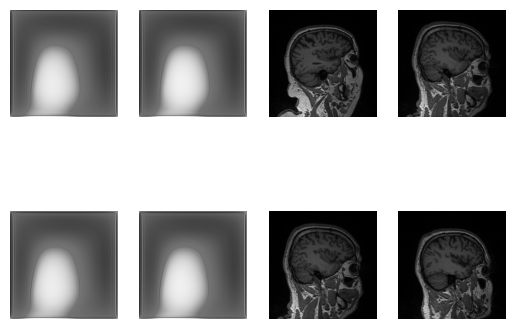

700/200000
Discriminator Loss: 0.1180508850302015
Encoding Loss: 9703.5751953125	Decoding Loss: -88244.5859375
VAE ELBo: 9140.510502232142
VAEGAN Loss: 9140.568214285715
Encoder grads: 1999.4127197265625	Decoder grads: -0.023037495091557503
Discriminator grads: -0.00017046229913830757
Decoded Images MEAN: 0.326885849237442	STD: 0.4464033842086792


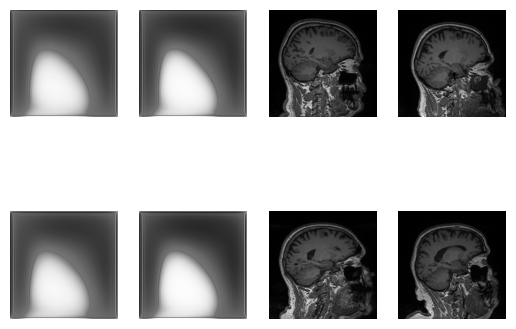

800/200000
Discriminator Loss: 0.27495865866541863
Encoding Loss: 105386.6796875	Decoding Loss: -85437.2890625
VAE ELBo: 21104.884306640626
VAEGAN Loss: 21105.0223828125
Encoder grads: 138566.25	Decoder grads: 0.04041115194559097
Discriminator grads: 0.00046896314597688615
Decoded Images MEAN: 0.21203835308551788	STD: 0.3880000710487366


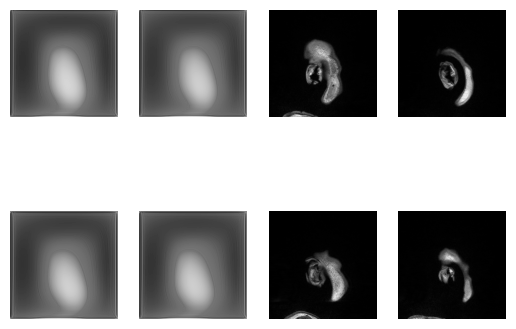

900/200000
Discriminator Loss: 0.15230166011386448
Encoding Loss: 6836.75341796875	Decoding Loss: -87055.2578125
VAE ELBo: 11436.727647569445
VAEGAN Loss: 11436.806527777779
Encoder grads: 2763.237060546875	Decoder grads: -0.00460708886384964
Discriminator grads: -0.0001460233033867553
Decoded Images MEAN: 0.3160291314125061	STD: 0.4420093894004822


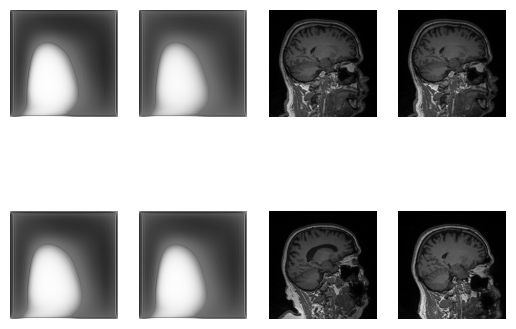

1000/200000
Discriminator Loss: 0.0546568992137909
Encoding Loss: 8930.3642578125	Decoding Loss: -87697.9296875
VAE ELBo: 4120.7041796875
VAEGAN Loss: 4120.7329453125
Encoder grads: 4858.4150390625	Decoder grads: -0.04053141921758652
Discriminator grads: -0.00016332055383827537
Decoded Images MEAN: 0.35910460352897644	STD: 0.46211984753608704


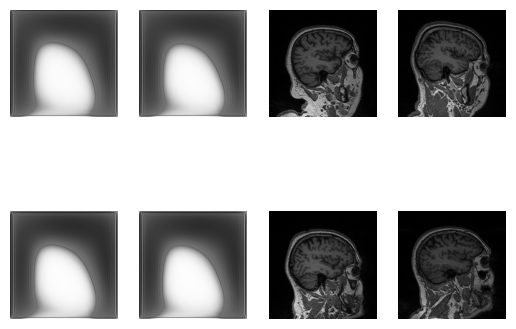

1100/200000
Discriminator Loss: 0.17358136079528114
Encoding Loss: 8507.111328125	Decoding Loss: -86603.5625
VAE ELBo: 12385.081285511364
VAEGAN Loss: 12385.175213068182
Encoder grads: 5085.32373046875	Decoder grads: 0.06258327513933182
Discriminator grads: -0.00049155845772475
Decoded Images MEAN: 0.24717402458190918	STD: 0.4076712131500244


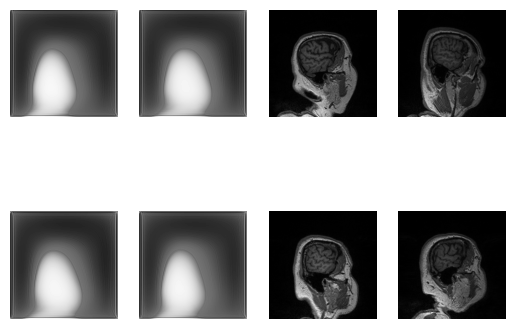

1200/200000
Discriminator Loss: 0.08867853234211603
Encoding Loss: 6385.47607421875	Decoding Loss: -87101.3671875
VAE ELBo: 6498.456243489583
VAEGAN Loss: 6498.5145703125
Encoder grads: 820.5095825195312	Decoder grads: -0.02275148779153824
Discriminator grads: -0.013155283406376839
Decoded Images MEAN: 0.26882120966911316	STD: 0.42188891768455505


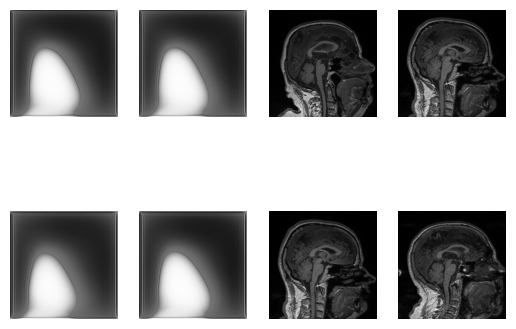

1300/200000
Discriminator Loss: 0.010509472168408907
Encoding Loss: 4664.51025390625	Decoding Loss: -87317.4765625
VAE ELBo: 1508.3103786057693
VAEGAN Loss: 1508.5063822115385
Encoder grads: 2329.778076171875	Decoder grads: -0.03619906306266785
Discriminator grads: -3.2075531482696533
Decoded Images MEAN: 0.4084380567073822	STD: 0.4648451507091522


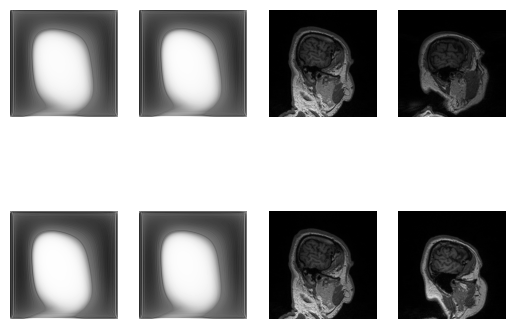

1400/200000
Discriminator Loss: 0.05757500546319144
Encoding Loss: 3888.68603515625	Decoding Loss: -86740.890625
VAE ELBo: 8049.666395089285
VAEGAN Loss: 8050.696618303571
Encoder grads: 1547.1846923828125	Decoder grads: -0.047066427767276764
Discriminator grads: -6.058897495269775
Decoded Images MEAN: 0.3051036298274994	STD: 0.43497714400291443


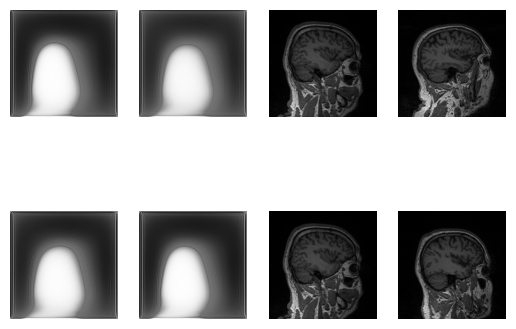

1500/200000
Discriminator Loss: 0.018810231854518255
Encoding Loss: 6040.880859375	Decoding Loss: -87458.875
VAE ELBo: 3791.360364583333
VAEGAN Loss: 3792.093921875
Encoder grads: 1768.7637939453125	Decoder grads: 0.0463816337287426
Discriminator grads: -11.237016677856445
Decoded Images MEAN: 0.31399327516555786	STD: 0.446177214384079


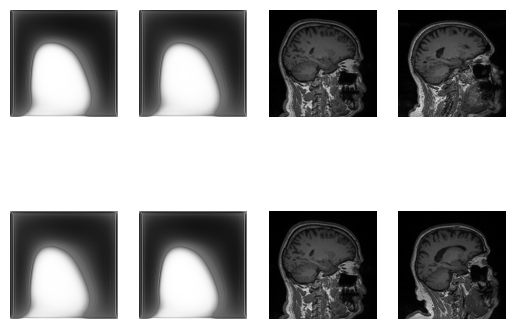

1600/200000
Discriminator Loss: 0.022574409407097845
Encoding Loss: 17639.0234375	Decoding Loss: -85577.5234375
VAE ELBo: 9398.6315234375
VAEGAN Loss: 9401.635229492187
Encoder grads: 19290.30078125	Decoder grads: 0.3373974561691284
Discriminator grads: -0.677025556564331
Decoded Images MEAN: 0.17046888172626495	STD: 0.35234004259109497


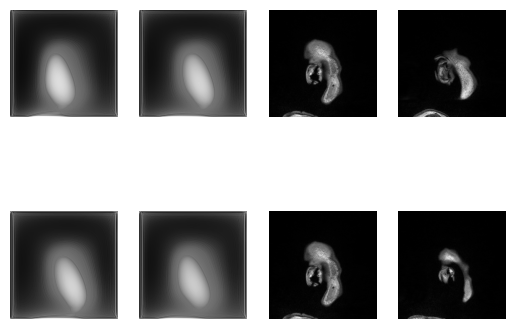

1700/200000
Discriminator Loss: 0.0015874065688866027
Encoding Loss: 4096.41552734375	Decoding Loss: -86722.4296875
VAE ELBo: 5481.161309742647
VAEGAN Loss: 5484.302909007353
Encoder grads: 1391.0343017578125	Decoder grads: 0.0030305986292660236
Discriminator grads: -3.107135772705078
Decoded Images MEAN: 0.3146781623363495	STD: 0.44627946615219116


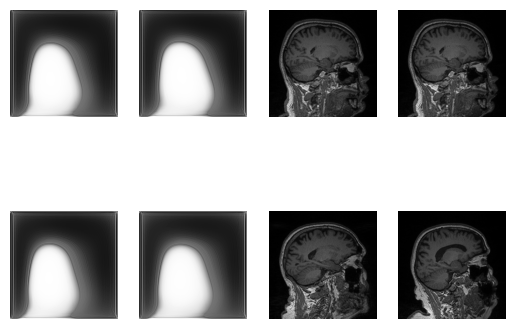

1800/200000
Discriminator Loss: 0.0003427217160868976
Encoding Loss: 5855.6875	Decoding Loss: -87913.203125
VAE ELBo: 2096.3888628472223
VAEGAN Loss: 2097.8459765625
Encoder grads: 2101.842529296875	Decoder grads: -0.020791208371520042
Discriminator grads: -4.051022052764893
Decoded Images MEAN: 0.4496167302131653	STD: 0.4846046566963196


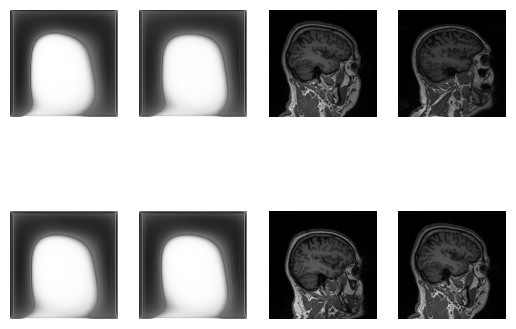

1900/200000
Discriminator Loss: 0.0009945962793732944
Encoding Loss: 7321.06494140625	Decoding Loss: -86179.71875
VAE ELBo: 6755.382347861842
VAEGAN Loss: 6760.70203125
Encoder grads: 5962.3017578125	Decoder grads: -0.025510963052511215
Discriminator grads: -0.6545224785804749
Decoded Images MEAN: 0.2564259171485901	STD: 0.4154510200023651


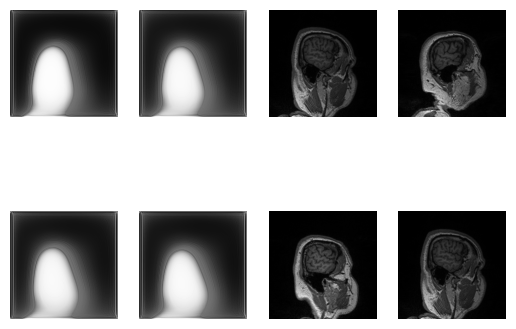

2000/200000
Discriminator Loss: 0.0003781422358006239
Encoding Loss: 1198.0595703125	Decoding Loss: -87057.2109375
VAE ELBo: 3758.859921875
VAEGAN Loss: 3761.98753515625
Encoder grads: 212.3321990966797	Decoder grads: -0.03136007860302925
Discriminator grads: -0.8475992679595947
Decoded Images MEAN: 0.2523615062236786	STD: 0.4034041464328766


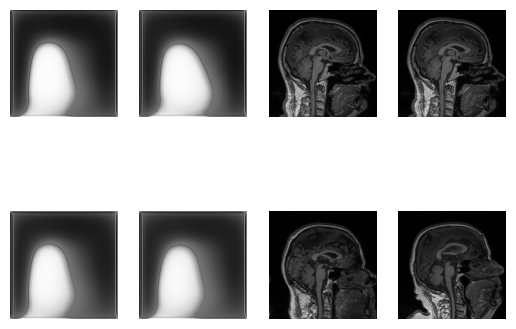

2100/200000
Discriminator Loss: 6.533643829503229e-05
Encoding Loss: 1798.3746337890625	Decoding Loss: -87087.4375
VAE ELBo: 885.8015959821429
VAEGAN Loss: 886.6079427083333
Encoder grads: 446.7158203125	Decoder grads: 0.2914285957813263
Discriminator grads: -0.8340031504631042
Decoded Images MEAN: 0.41679105162620544	STD: 0.4590969979763031


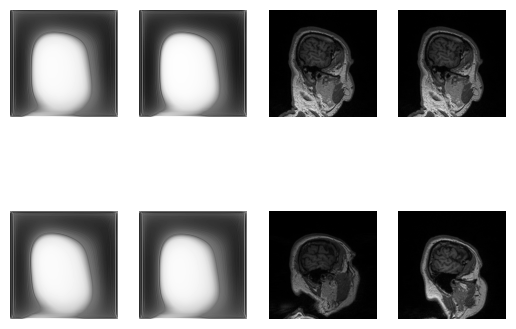

2200/200000
Discriminator Loss: 0.0003482668048871512
Encoding Loss: 1847.3297119140625	Decoding Loss: -86694.75
VAE ELBo: 4932.443877840909
VAEGAN Loss: 4936.9777805397725
Encoder grads: 322.0084228515625	Decoder grads: -0.004663999192416668
Discriminator grads: -0.7857542634010315
Decoded Images MEAN: 0.33515018224716187	STD: 0.4404181241989136


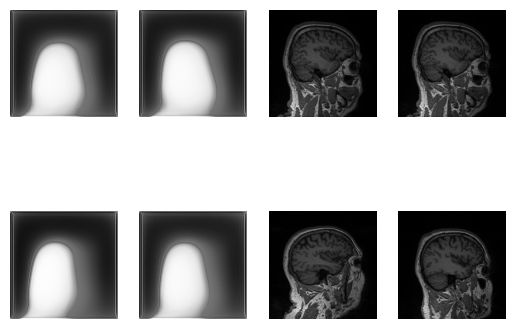

2300/200000
Discriminator Loss: 0.0001278071388926195
Encoding Loss: 2489.907958984375	Decoding Loss: -86905.6328125
VAE ELBo: 2396.941372282609
VAEGAN Loss: 2399.169269701087
Encoder grads: 528.1517333984375	Decoder grads: 0.050152335315942764
Discriminator grads: -0.656067430973053
Decoded Images MEAN: 0.32476064562797546	STD: 0.42726314067840576


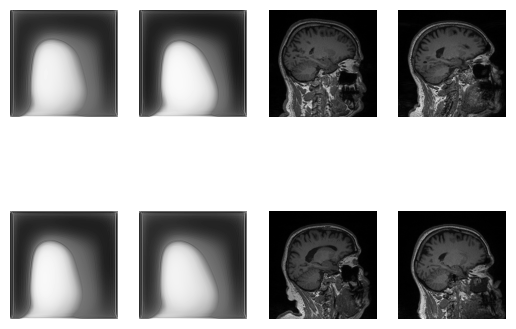

2400/200000
Discriminator Loss: 0.0003003330101879935
Encoding Loss: 5102.7607421875	Decoding Loss: -87221.9921875
VAE ELBo: 6060.5260611979165
VAEGAN Loss: 6066.290556640625
Encoder grads: 5698.966796875	Decoder grads: -0.021998923271894455
Discriminator grads: -0.28943294286727905
Decoded Images MEAN: 0.29153624176979065	STD: 0.4257979691028595


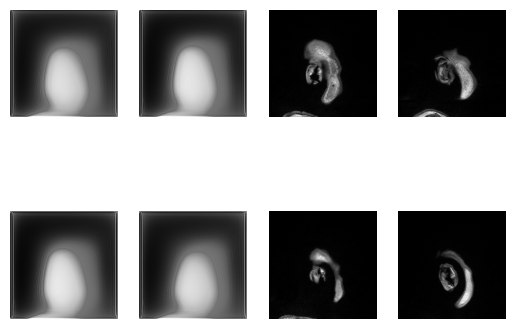

2500/200000
Discriminator Loss: 0.0001428245374932885
Encoding Loss: 1227.551513671875	Decoding Loss: -86696.1328125
VAE ELBo: 3611.75119375
VAEGAN Loss: 3615.28980625
Encoder grads: 469.8639831542969	Decoder grads: -0.08426627516746521
Discriminator grads: -0.3837064206600189
Decoded Images MEAN: 0.28625938296318054	STD: 0.393978089094162


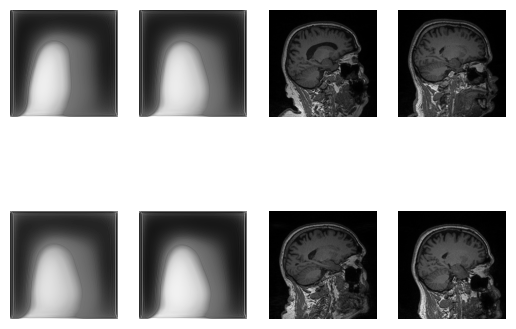

2600/200000
Discriminator Loss: 4.34958530912319e-05
Encoding Loss: 2117.29736328125	Decoding Loss: -87470.671875
VAE ELBo: 1410.8462620192308
VAEGAN Loss: 1412.2331189903846
Encoder grads: 398.52685546875	Decoder grads: 0.04897709935903549
Discriminator grads: -0.3306049406528473
Decoded Images MEAN: 0.29814448952674866	STD: 0.42099037766456604


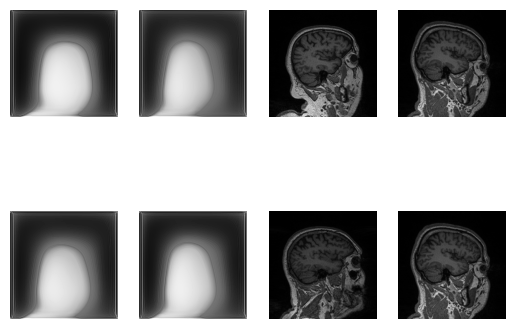

2700/200000
Discriminator Loss: 0.0001379826495906821
Encoding Loss: 2317.578125	Decoding Loss: -85458.03125
VAE ELBo: 4641.1067766203705
VAEGAN Loss: 4645.765026041667
Encoder grads: 1302.2039794921875	Decoder grads: 0.11417964100837708
Discriminator grads: -0.24280717968940735
Decoded Images MEAN: 0.27116885781288147	STD: 0.3897164762020111


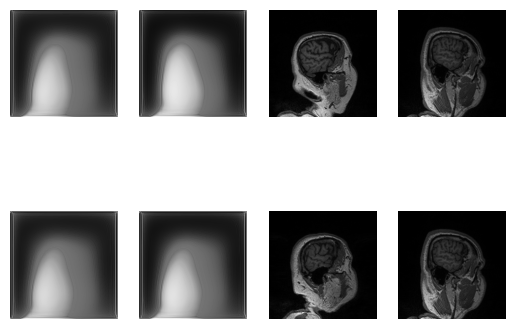

2800/200000
Discriminator Loss: 6.169078738561698e-05
Encoding Loss: 1667.594970703125	Decoding Loss: -86285.4765625
VAE ELBo: 2558.16328125
VAEGAN Loss: 2560.763097098214
Encoder grads: 244.22393798828125	Decoder grads: -0.05855373293161392
Discriminator grads: -0.2966228723526001
Decoded Images MEAN: 0.26400741934776306	STD: 0.3857254385948181


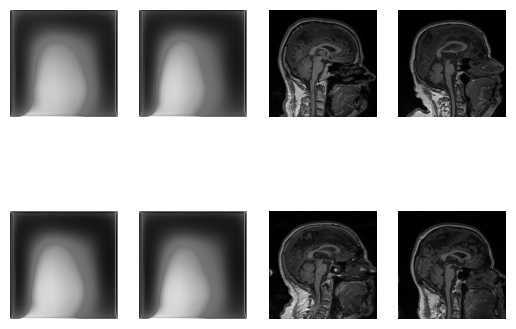

2900/200000
Discriminator Loss: 1.2024730275352968e-05
Encoding Loss: 1564.73828125	Decoding Loss: -88023.3203125
VAE ELBo: 619.4472790948275
VAEGAN Loss: 620.0821955818966
Encoder grads: 507.5282287597656	Decoder grads: -0.02647930569946766
Discriminator grads: -0.17878659069538116
Decoded Images MEAN: 0.288363516330719	STD: 0.411563903093338


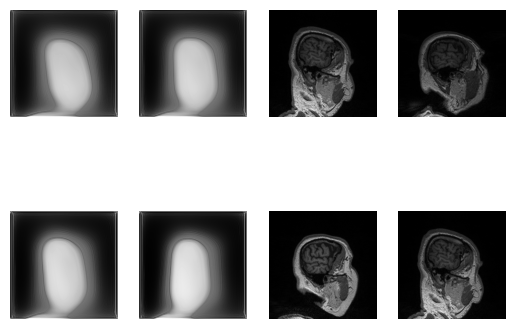

3000/200000
Discriminator Loss: 6.737819034606219e-05
Encoding Loss: 1060.179931640625	Decoding Loss: -85763.125
VAE ELBo: 3543.4534609375
VAEGAN Loss: 3547.1132265625
Encoder grads: 441.2489013671875	Decoder grads: -0.1103052869439125
Discriminator grads: -0.2577332556247711
Decoded Images MEAN: 0.31907230615615845	STD: 0.4030998945236206


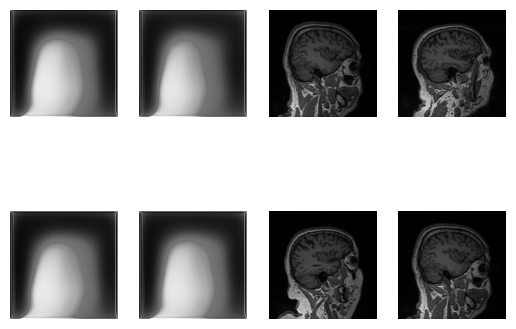

3100/200000
Discriminator Loss: 2.7108599146407457e-05
Encoding Loss: 2104.40478515625	Decoding Loss: -86026.375
VAE ELBo: 1722.6207535282258
VAEGAN Loss: 1724.4158014112904
Encoder grads: 182.32618713378906	Decoder grads: 0.03781290352344513
Discriminator grads: -0.33273711800575256
Decoded Images MEAN: 0.34491273760795593	STD: 0.4176803529262543


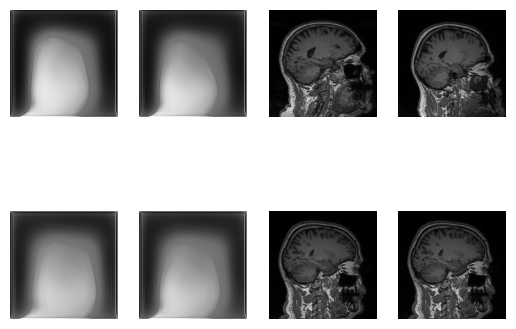

3200/200000
Discriminator Loss: 6.639095430728048e-05
Encoding Loss: 6438.23681640625	Decoding Loss: -85651.609375
VAE ELBo: 4408.014279785156
VAEGAN Loss: 4412.660405273437
Encoder grads: 6645.4658203125	Decoder grads: -0.05055973678827286
Discriminator grads: -0.13235892355442047
Decoded Images MEAN: 0.25473424792289734	STD: 0.41182392835617065


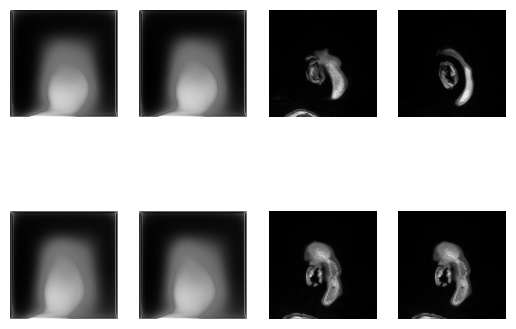

3300/200000
Discriminator Loss: 3.4614351055951735e-05
Encoding Loss: 796.4520874023438	Decoding Loss: -85812.1484375
VAE ELBo: 2681.5921827651514
VAEGAN Loss: 2684.418915719697
Encoder grads: 96.13591766357422	Decoder grads: -0.010147079825401306
Discriminator grads: -0.16771335899829865
Decoded Images MEAN: 0.2883414328098297	STD: 0.3726166784763336


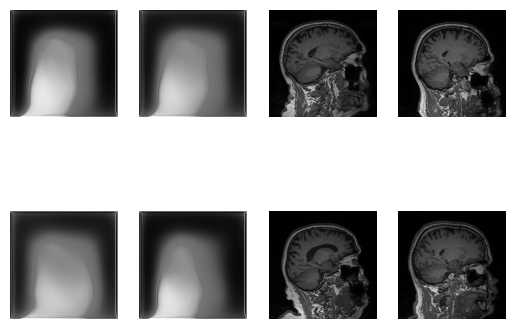

3400/200000
Discriminator Loss: 1.1403540163027013e-05
Encoding Loss: 1817.7606201171875	Decoding Loss: -85752.8359375
VAE ELBo: 1048.7369784007353
VAEGAN Loss: 1049.8422426470588
Encoder grads: 597.9764404296875	Decoder grads: -0.2029923051595688
Discriminator grads: -0.1436224728822708
Decoded Images MEAN: 0.2818009853363037	STD: 0.384382963180542


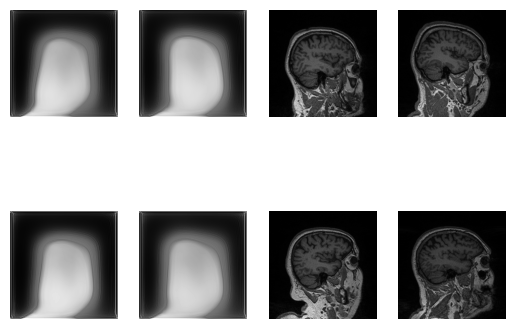

3500/200000
Discriminator Loss: 3.737960266880691e-05
Encoding Loss: 1370.2763671875	Decoding Loss: -83792.453125
VAE ELBo: 3500.5745
VAEGAN Loss: 3504.337310267857
Encoder grads: 669.7191162109375	Decoder grads: 0.10574159026145935
Discriminator grads: -0.10774870216846466
Decoded Images MEAN: 0.29154783487319946	STD: 0.3689480423927307


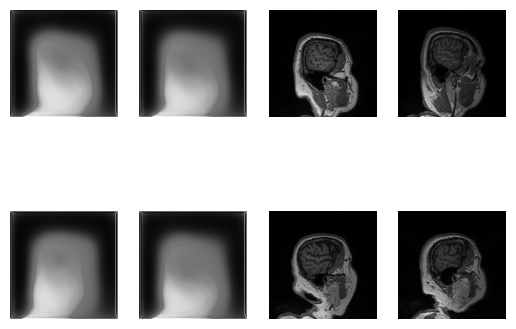

3600/200000
Discriminator Loss: 1.8051997903967278e-05
Encoding Loss: 1875.2867431640625	Decoding Loss: -85851.1640625
VAE ELBo: 1944.719978298611
VAEGAN Loss: 1946.8195855034721
Encoder grads: 297.4692687988281	Decoder grads: -0.08592694997787476
Discriminator grads: -0.11750146001577377
Decoded Images MEAN: 0.25139570236206055	STD: 0.3609149754047394


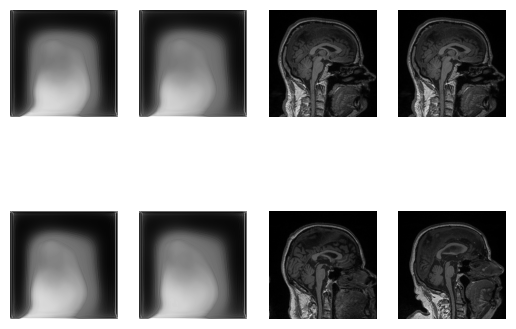

3700/200000
Discriminator Loss: 3.743524870810074e-06
Encoding Loss: 1319.4935302734375	Decoding Loss: -86762.8984375
VAE ELBo: 470.8084966216216
VAEGAN Loss: 471.32145692567565
Encoder grads: 475.45843505859375	Decoder grads: -0.09677662700414658
Discriminator grads: -0.08955670893192291
Decoded Images MEAN: 0.22361834347248077	STD: 0.3749907314777374


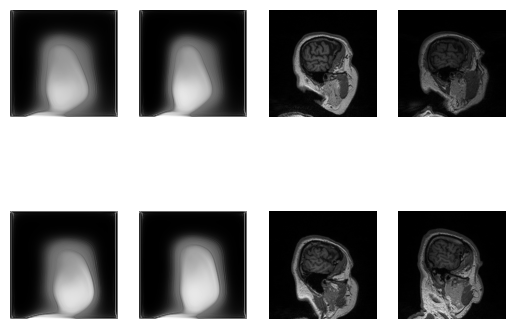

3800/200000
Discriminator Loss: 2.155896241004628e-05
Encoding Loss: 698.4929809570312	Decoding Loss: -85078.875
VAE ELBo: 2743.353861019737
VAEGAN Loss: 2746.3549013157894
Encoder grads: 329.6545104980469	Decoder grads: 0.011223919689655304
Discriminator grads: -0.07057246565818787
Decoded Images MEAN: 0.26027676463127136	STD: 0.33916470408439636


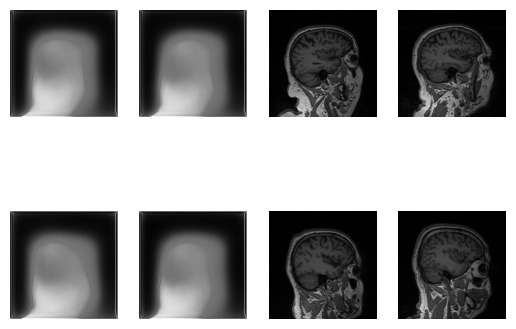

3900/200000
Discriminator Loss: 9.2052268043447e-06
Encoding Loss: 1002.8606567382812	Decoding Loss: -85736.4921875
VAE ELBo: 1338.5823177083332
VAEGAN Loss: 1340.048501602564
Encoder grads: 189.97232055664062	Decoder grads: -0.0069437213242053986
Discriminator grads: -0.10576442629098892
Decoded Images MEAN: 0.29827138781547546	STD: 0.3774201571941376


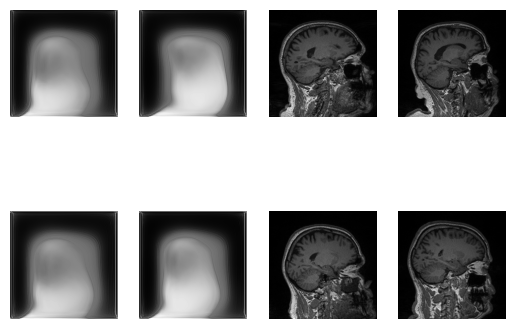

4000/200000
Discriminator Loss: 2.3044863861287013e-05
Encoding Loss: 3926.56298828125	Decoding Loss: -85146.5
VAE ELBo: 3463.18467578125
VAEGAN Loss: 3467.001578125
Encoder grads: 3365.130126953125	Decoder grads: -0.010890839621424675
Discriminator grads: -0.06310240179300308
Decoded Images MEAN: 0.24594298005104065	STD: 0.40836575627326965


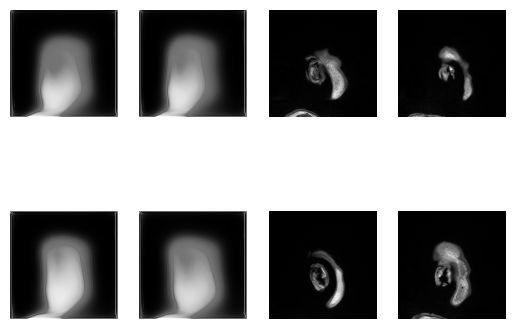

4100/200000
Discriminator Loss: 1.2591138834179174e-05
Encoding Loss: 710.982177734375	Decoding Loss: -85399.609375
VAE ELBo: 2119.810447789634
VAEGAN Loss: 2122.1444493140243
Encoder grads: 242.57205200195312	Decoder grads: 0.04111938923597336
Discriminator grads: -0.0906059518456459
Decoded Images MEAN: 0.2853471040725708	STD: 0.36940789222717285


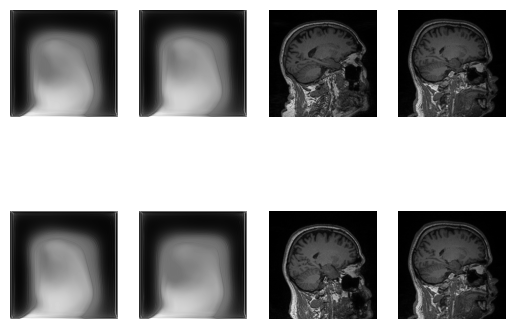

4200/200000
Discriminator Loss: 4.33096421710659e-06
Encoding Loss: 879.1254272460938	Decoding Loss: -85380.0703125
VAE ELBo: 832.6915531994048
VAEGAN Loss: 833.6052715773809
Encoder grads: 149.57257080078125	Decoder grads: 0.004512090235948563
Discriminator grads: -0.07375060021877289
Decoded Images MEAN: 0.2460043728351593	STD: 0.3593038022518158


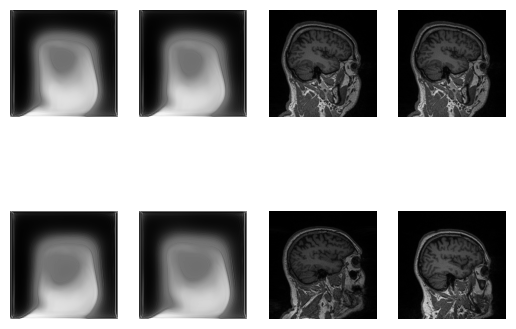

4300/200000
Discriminator Loss: 1.4484153869615998e-05
Encoding Loss: 652.6781616210938	Decoding Loss: -83324.9765625
VAE ELBo: 2816.397312863372
VAEGAN Loss: 2819.5253125
Encoder grads: 145.43763732910156	Decoder grads: -0.021160783246159554
Discriminator grads: -0.08054722845554352
Decoded Images MEAN: 0.29704076051712036	STD: 0.37120720744132996


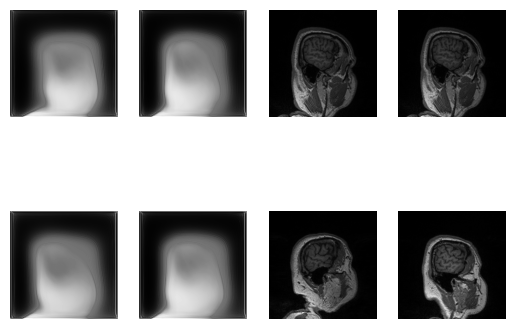

4400/200000
Discriminator Loss: 7.275176268938759e-06
Encoding Loss: 667.6220092773438	Decoding Loss: -85670.8515625
VAE ELBo: 1577.1776509232955
VAEGAN Loss: 1578.9282457386364
Encoder grads: 107.89697265625	Decoder grads: -0.00902901217341423
Discriminator grads: -0.08009891957044601
Decoded Images MEAN: 0.24888241291046143	STD: 0.36701223254203796


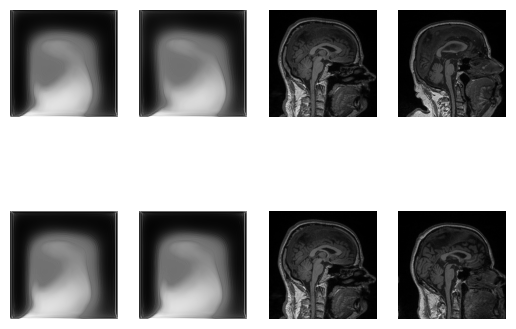

4500/200000
Discriminator Loss: 1.5482993654182388e-06
Encoding Loss: 1131.764404296875	Decoding Loss: -86710.5625
VAE ELBo: 384.0629965277778
VAEGAN Loss: 384.49211979166665
Encoder grads: 494.7847900390625	Decoder grads: -0.06912510842084885
Discriminator grads: -0.062187790870666504
Decoded Images MEAN: 0.24870525300502777	STD: 0.3868180811405182


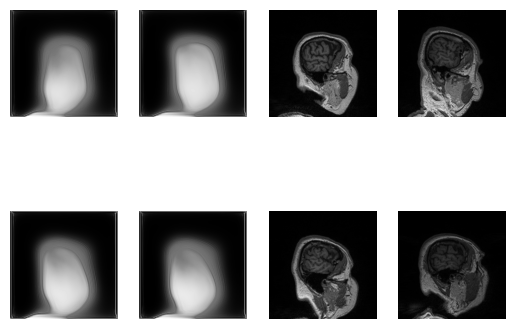

4600/200000
Discriminator Loss: 9.113906119676793e-06
Encoding Loss: 639.0135498046875	Decoding Loss: -84912.5859375
VAE ELBo: 2254.6537992527174
VAEGAN Loss: 2257.173067255435
Encoder grads: 135.9591522216797	Decoder grads: -0.07990993559360504
Discriminator grads: -0.0698651671409607
Decoded Images MEAN: 0.28125	STD: 0.3687119483947754


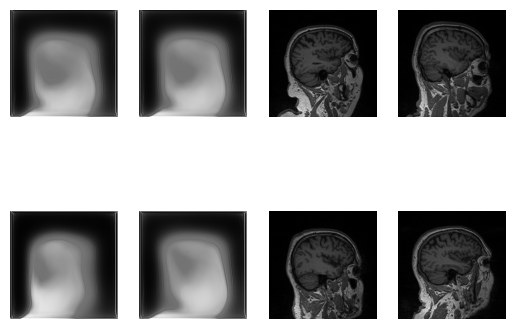

4700/200000
Discriminator Loss: 3.986908327243192e-06
Encoding Loss: 645.4887084960938	Decoding Loss: -85794.578125
VAE ELBo: 1103.8693966090425
VAEGAN Loss: 1105.1048736702128
Encoder grads: 47.67380905151367	Decoder grads: -0.04454439878463745
Discriminator grads: -0.0764491856098175
Decoded Images MEAN: 0.30807024240493774	STD: 0.3678620755672455


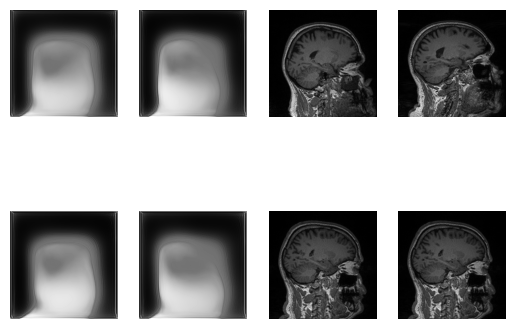

4800/200000
Discriminator Loss: 1.016856969120757e-05
Encoding Loss: 2531.055419921875	Decoding Loss: -85809.9765625
VAE ELBo: 2872.7315364583333
VAEGAN Loss: 2875.9583723958335
Encoder grads: 2317.014404296875	Decoder grads: 0.16135017573833466
Discriminator grads: -0.060620155185461044
Decoded Images MEAN: 0.26358842849731445	STD: 0.4027519226074219


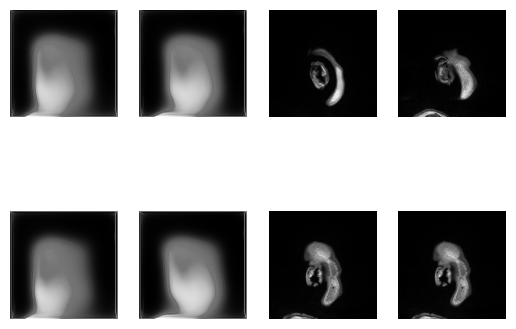

4900/200000
Discriminator Loss: 5.713423324406755e-06
Encoding Loss: 408.0682067871094	Decoding Loss: -85403.75
VAE ELBo: 1763.1333386479591
VAEGAN Loss: 1765.1131999362244
Encoder grads: 56.2239875793457	Decoder grads: 0.06979244947433472
Discriminator grads: -0.051958706229925156
Decoded Images MEAN: 0.28775864839553833	STD: 0.3647579550743103


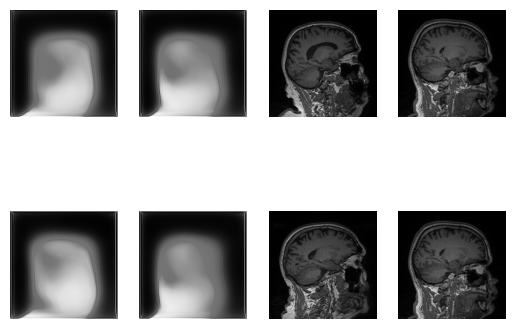

5000/200000
Discriminator Loss: 2.000114420661703e-06
Encoding Loss: 790.3453979492188	Decoding Loss: -84934.0546875
VAE ELBo: 684.1359578125
VAEGAN Loss: 684.91310625
Encoder grads: 170.5553741455078	Decoder grads: 0.045808181166648865
Discriminator grads: -0.06652368605136871
Decoded Images MEAN: 0.3064517378807068	STD: 0.36649930477142334


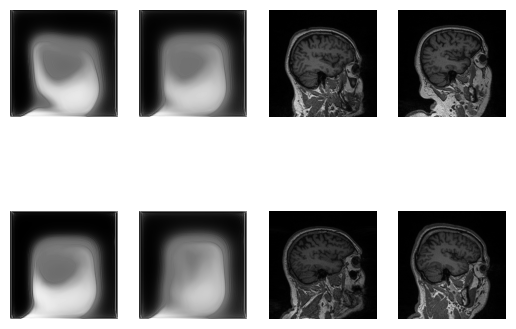

5100/200000
Discriminator Loss: 6.8083401728311885e-06
Encoding Loss: 998.7664184570312	Decoding Loss: -83128.7890625
VAE ELBo: 2352.4304886642158
VAEGAN Loss: 2355.0988511029414
Encoder grads: 469.2989501953125	Decoder grads: -0.1475103348493576
Discriminator grads: -0.06841336190700531
Decoded Images MEAN: 0.2857746183872223	STD: 0.3737543225288391


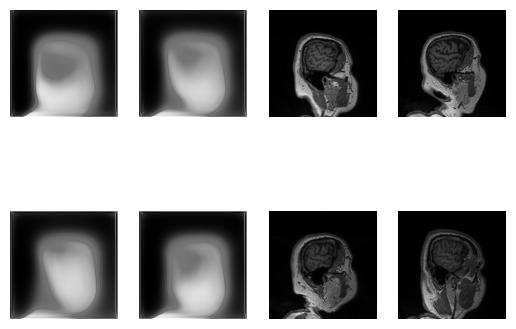

5200/200000
Discriminator Loss: 3.477558219366564e-06
Encoding Loss: 668.6707153320312	Decoding Loss: -85195.6640625
VAE ELBo: 1314.211844951923
VAEGAN Loss: 1315.7098572716345
Encoder grads: 102.46163177490234	Decoder grads: 0.03606598079204559
Discriminator grads: -0.03711646795272827
Decoded Images MEAN: 0.24253538250923157	STD: 0.34980157017707825


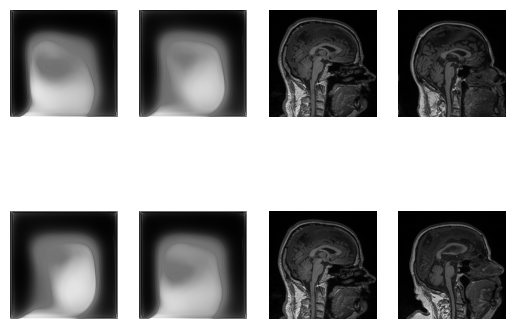

5300/200000
Discriminator Loss: 7.527833200446418e-07
Encoding Loss: 807.8939819335938	Decoding Loss: -82942.2578125
VAE ELBo: 321.1020504127358
VAEGAN Loss: 321.4699778891509
Encoder grads: 408.2604675292969	Decoder grads: -0.020494628697633743
Discriminator grads: -0.049931783229112625
Decoded Images MEAN: 0.23466216027736664	STD: 0.37293338775634766


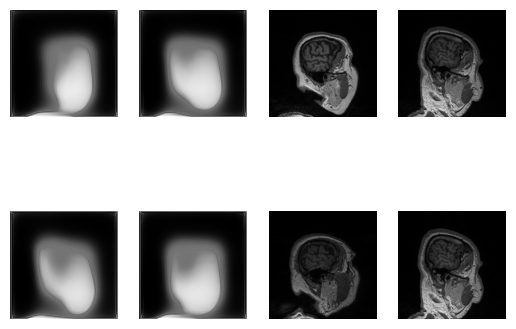

5400/200000
Discriminator Loss: 4.498716349459115e-06
Encoding Loss: 471.6488952636719	Decoding Loss: -84453.1484375
VAE ELBo: 1899.5300593171296
VAEGAN Loss: 1901.6974754050925
Encoder grads: 134.4854278564453	Decoder grads: 0.03249235451221466
Discriminator grads: -0.0396355539560318
Decoded Images MEAN: 0.2799198031425476	STD: 0.3625462055206299


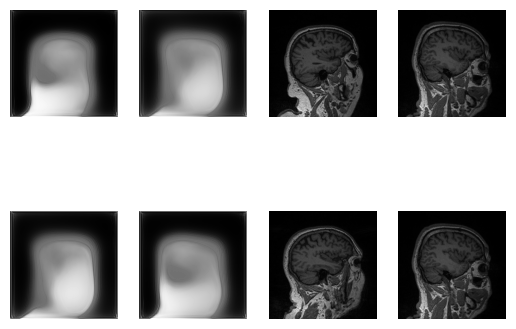

5500/200000
Discriminator Loss: 1.997362219051204e-06
Encoding Loss: 554.6832275390625	Decoding Loss: -85168.6796875
VAE ELBo: 927.6928465909091
VAEGAN Loss: 928.7571349431818
Encoder grads: 66.6436767578125	Decoder grads: -0.013822746463119984
Discriminator grads: -0.03541376069188118
Decoded Images MEAN: 0.2850103974342346	STD: 0.3707057237625122


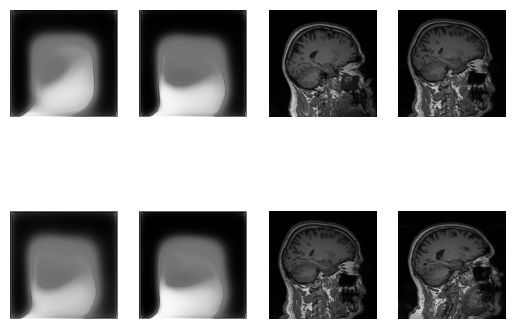

5600/200000
Discriminator Loss: 5.1371791076754955e-06
Encoding Loss: 2887.436279296875	Decoding Loss: -84383.765625
VAE ELBo: 2433.4379227120535
VAEGAN Loss: 2436.2273842075892
Encoder grads: 2227.58349609375	Decoder grads: -0.23867426812648773
Discriminator grads: -0.023847408592700958
Decoded Images MEAN: 0.2357770949602127	STD: 0.4096115529537201


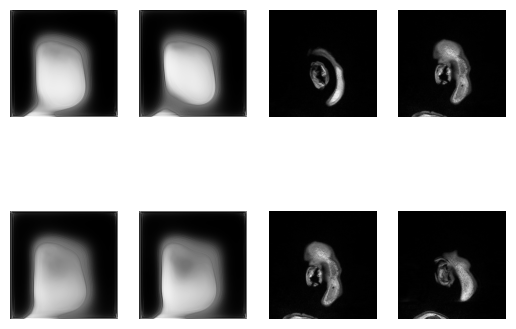

5700/200000
Discriminator Loss: 2.9181423183457043e-06
Encoding Loss: 494.7052917480469	Decoding Loss: -84908.9375
VAE ELBo: 1497.9703782894737
VAEGAN Loss: 1499.6853275767544
Encoder grads: 109.71041107177734	Decoder grads: 0.029144050553441048
Discriminator grads: -0.03125074878334999
Decoded Images MEAN: 0.2865532338619232	STD: 0.37319791316986084


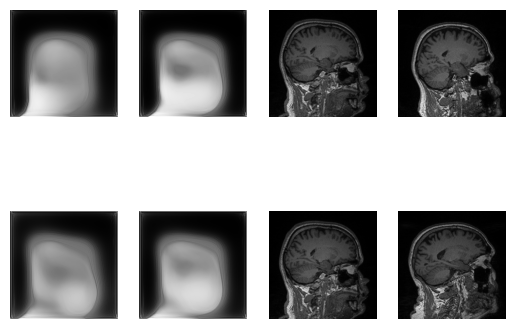

5800/200000
Discriminator Loss: 1.0311111967392458e-06
Encoding Loss: 449.6610412597656	Decoding Loss: -84880.75
VAE ELBo: 581.7074205280172
VAEGAN Loss: 582.3817780172413
Encoder grads: 34.7727165222168	Decoder grads: 0.031929127871990204
Discriminator grads: -0.05143214017152786
Decoded Images MEAN: 0.2997741401195526	STD: 0.38447514176368713


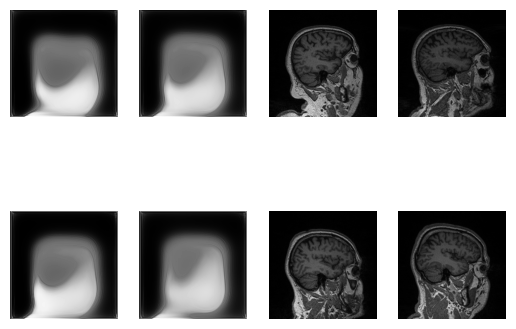

5900/200000
Discriminator Loss: 3.5387566692977195e-06
Encoding Loss: 535.888671875	Decoding Loss: -83666.171875
VAE ELBo: 2017.5944716631357
VAEGAN Loss: 2019.9174549788136
Encoder grads: 200.06871032714844	Decoder grads: -0.01702887937426567
Discriminator grads: -0.04622353985905647
Decoded Images MEAN: 0.31128308176994324	STD: 0.38764533400535583


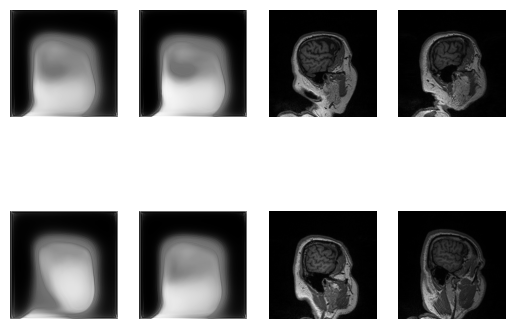

6000/200000
Discriminator Loss: 1.8281769492508222e-06
Encoding Loss: 493.164794921875	Decoding Loss: -85161.4765625
VAE ELBo: 1132.36809375
VAEGAN Loss: 1133.6741588541668
Encoder grads: 64.1748046875	Decoder grads: -0.04300263896584511
Discriminator grads: -0.01996825635433197
Decoded Images MEAN: 0.2444078028202057	STD: 0.33900246024131775


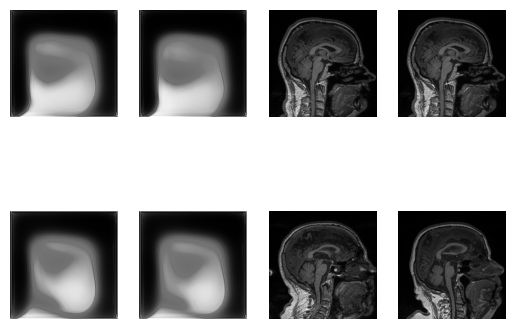

6100/200000
Discriminator Loss: 3.9788512904273317e-07
Encoding Loss: 954.1763916015625	Decoding Loss: -82961.5703125
VAE ELBo: 274.6542763831967
VAEGAN Loss: 274.97584144467214
Encoder grads: 514.0380249023438	Decoder grads: 0.016130339354276657
Discriminator grads: -0.0343768484890461
Decoded Images MEAN: 0.2566088140010834	STD: 0.3920842111110687


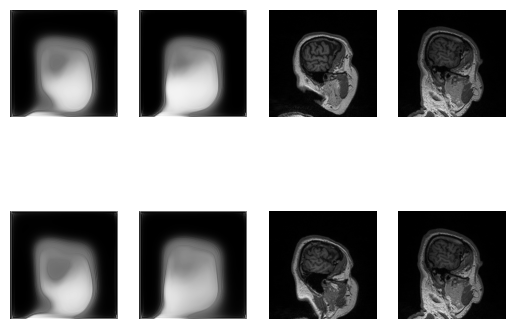

6200/200000
Discriminator Loss: 2.3940787181228157e-06
Encoding Loss: 298.982666015625	Decoding Loss: -84362.1015625
VAE ELBo: 1644.567628528226
VAEGAN Loss: 1646.4666481854838
Encoder grads: 60.46952438354492	Decoder grads: -0.016143862158060074
Discriminator grads: -0.02371724136173725
Decoded Images MEAN: 0.2868589460849762	STD: 0.36272335052490234


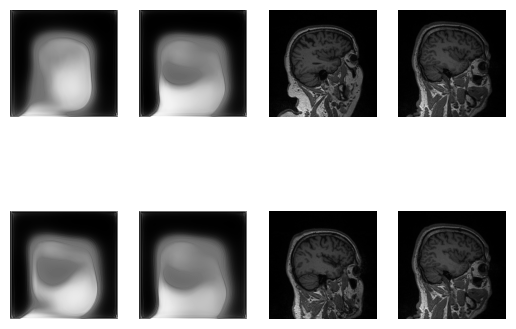

6300/200000
Discriminator Loss: 1.0695264513959132e-06
Encoding Loss: 325.9496154785156	Decoding Loss: -85064.296875
VAE ELBo: 802.928607390873
VAEGAN Loss: 803.8634970238095
Encoder grads: 53.65517044067383	Decoder grads: -0.02679739147424698
Discriminator grads: -0.022092187777161598
Decoded Images MEAN: 0.29685723781585693	STD: 0.3818330764770508


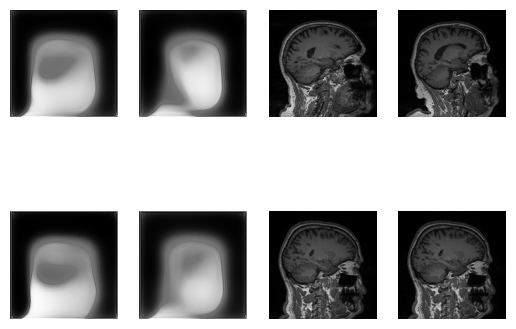

6400/200000
Discriminator Loss: 2.7662166928621447e-06
Encoding Loss: 1617.106689453125	Decoding Loss: -84047.3046875
VAE ELBo: 2113.619168701172
VAEGAN Loss: 2116.074698486328
Encoder grads: 1267.932861328125	Decoder grads: -0.013264171779155731
Discriminator grads: -0.01762714423239231
Decoded Images MEAN: 0.23277883231639862	STD: 0.402935653924942


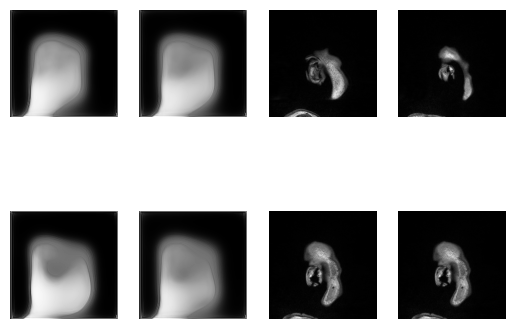

6500/200000
Discriminator Loss: 1.5815954292730356e-06
Encoding Loss: 188.3014373779297	Decoding Loss: -84770.2265625
VAE ELBo: 1304.6526778846153
VAEGAN Loss: 1306.165
Encoder grads: 33.406978607177734	Decoder grads: 0.023822182789444923
Discriminator grads: -0.01788094826042652
Decoded Images MEAN: 0.28387486934661865	STD: 0.362537682056427


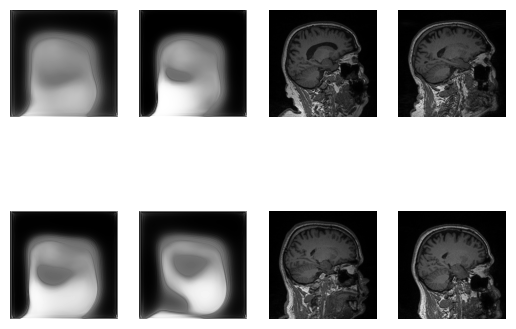

6600/200000
Discriminator Loss: 5.576825435238071e-07
Encoding Loss: 320.2553405761719	Decoding Loss: -84648.7421875
VAE ELBo: 507.5482634943182
VAEGAN Loss: 508.1442057291667
Encoder grads: -0.5424431562423706	Decoder grads: 0.02445690706372261
Discriminator grads: -0.029430048540234566
Decoded Images MEAN: 0.3013485372066498	STD: 0.38427504897117615


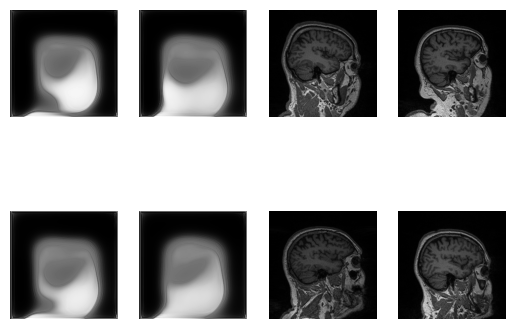

6700/200000
Discriminator Loss: 1.929080758396703e-06
Encoding Loss: 321.7192077636719	Decoding Loss: -83484.0390625
VAE ELBo: 1768.4677798507462
VAEGAN Loss: 1770.523973880597
Encoder grads: 66.90216064453125	Decoder grads: 0.029242292046546936
Discriminator grads: -0.03207748010754585
Decoded Images MEAN: 0.3176696300506592	STD: 0.39696037769317627


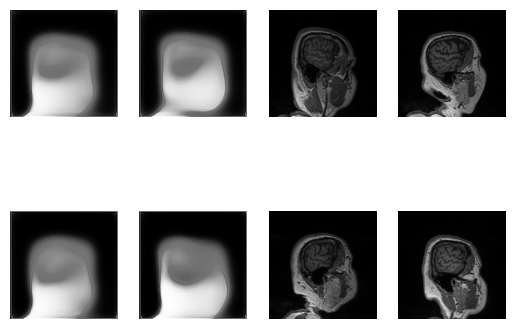

6800/200000
Discriminator Loss: 9.979066164626548e-07
Encoding Loss: 345.501953125	Decoding Loss: -84983.7109375
VAE ELBo: 993.8292865349265
VAEGAN Loss: 994.9875666360294
Encoder grads: 24.834999084472656	Decoder grads: -0.04294433444738388
Discriminator grads: -0.011094659566879272
Decoded Images MEAN: 0.23436163365840912	STD: 0.3291626274585724


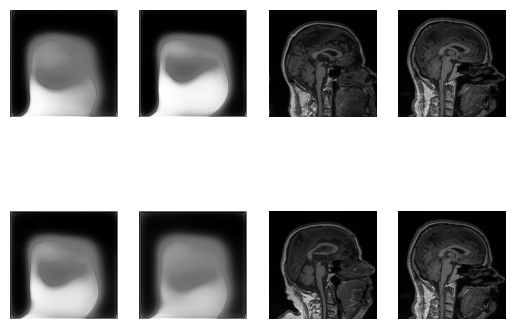

6900/200000
Discriminator Loss: 2.1625962909783467e-07
Encoding Loss: 331.63104248046875	Decoding Loss: -82534.3359375
VAE ELBo: 240.56264605978262
VAEGAN Loss: 240.84816236413045
Encoder grads: 49.038734436035156	Decoder grads: 0.054521068930625916
Discriminator grads: -0.021168017759919167
Decoded Images MEAN: 0.26415491104125977	STD: 0.39609095454216003


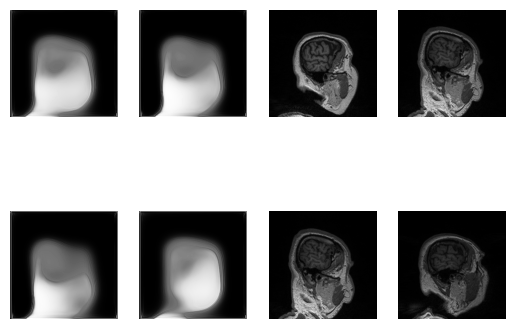

7000/200000
Discriminator Loss: 1.3115616498648056e-06
Encoding Loss: 257.24786376953125	Decoding Loss: -84126.9609375
VAE ELBo: 1450.8242890625
VAEGAN Loss: 1452.5138470982142
Encoder grads: 70.388916015625	Decoder grads: -0.00702478364109993
Discriminator grads: -0.014879835769534111
Decoded Images MEAN: 0.29584404826164246	STD: 0.3676702678203583


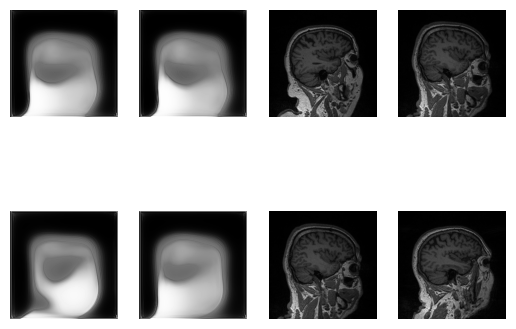

7100/200000
Discriminator Loss: 5.835168080856945e-07
Encoding Loss: 317.9896545410156	Decoding Loss: -85035.1796875
VAE ELBo: 710.5391868397887
VAEGAN Loss: 711.3723646566901
Encoder grads: 156.67257690429688	Decoder grads: 0.03595224767923355
Discriminator grads: -0.012656000442802906
Decoded Images MEAN: 0.2970176935195923	STD: 0.39099642634391785


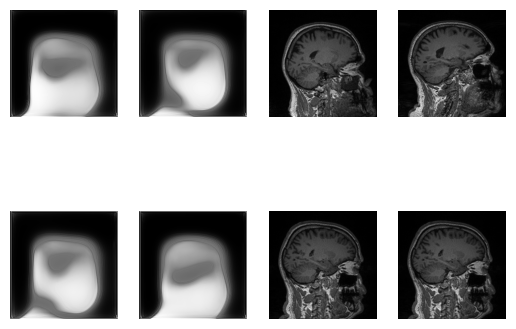

7200/200000
Discriminator Loss: 1.513251001799492e-06
Encoding Loss: 1428.9088134765625	Decoding Loss: -84257.265625
VAE ELBo: 1873.2410210503472
VAEGAN Loss: 1875.432978515625
Encoder grads: 833.7166748046875	Decoder grads: -0.09597401320934296
Discriminator grads: -0.009434514679014683
Decoded Images MEAN: 0.23942740261554718	STD: 0.40646442770957947


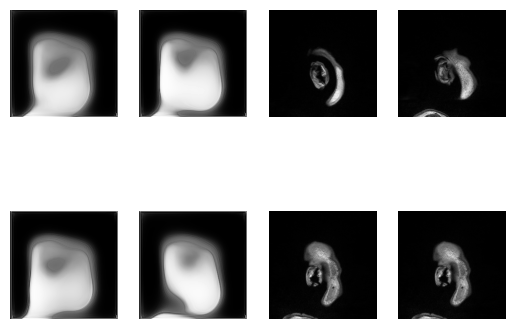

7300/200000
Discriminator Loss: 8.651485100702689e-07
Encoding Loss: 418.0015563964844	Decoding Loss: -84529.3984375
VAE ELBo: 1159.3886215753425
VAEGAN Loss: 1160.7405297517123
Encoder grads: 43.79431915283203	Decoder grads: -0.06582346558570862
Discriminator grads: -0.012385085225105286
Decoded Images MEAN: 0.30620527267456055	STD: 0.37960952520370483


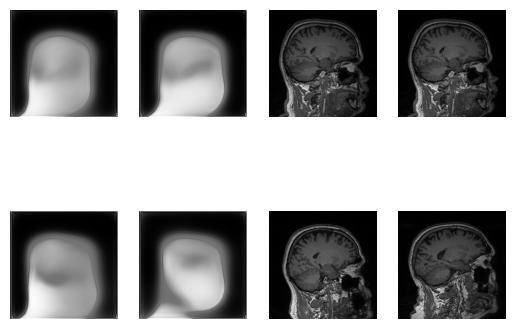

7400/200000
Discriminator Loss: 3.027058581308764e-07
Encoding Loss: 215.54869079589844	Decoding Loss: -84596.5546875
VAE ELBo: 449.73473711993245
VAEGAN Loss: 450.2683562077703
Encoder grads: -40.76598358154297	Decoder grads: -0.0018023811280727386
Discriminator grads: -0.010884180665016174
Decoded Images MEAN: 0.27545085549354553	STD: 0.3524267077445984


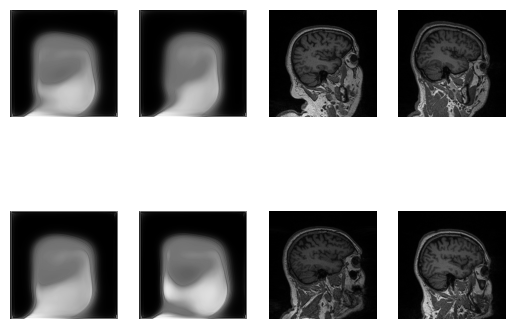

7500/200000
Discriminator Loss: 1.0525669849206073e-06
Encoding Loss: 274.8995056152344	Decoding Loss: -82787.0234375
VAE ELBo: 1574.0580916666668
VAEGAN Loss: 1575.901790625
Encoder grads: 40.022342681884766	Decoder grads: 0.0005515692755579948
Discriminator grads: -0.017091551795601845
Decoded Images MEAN: 0.2978617250919342	STD: 0.38440465927124023


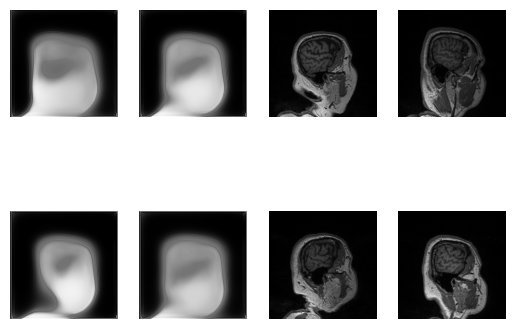

7600/200000
Discriminator Loss: 5.423007266807345e-07
Encoding Loss: 301.97174072265625	Decoding Loss: -84891.4140625
VAE ELBo: 886.6974043996711
VAEGAN Loss: 887.7374578536184
Encoder grads: -1.7033538818359375	Decoder grads: -0.015076607465744019
Discriminator grads: -0.007803547661751509
Decoded Images MEAN: 0.23969626426696777	STD: 0.33074742555618286


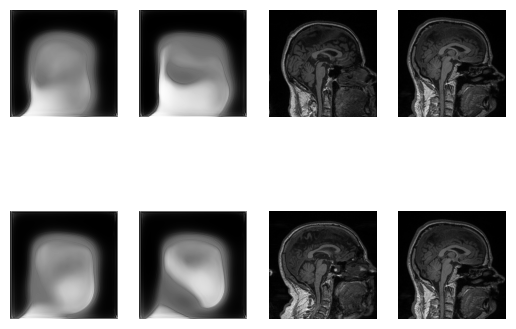

7700/200000
Discriminator Loss: 1.163739098164906e-07
Encoding Loss: 671.2299194335938	Decoding Loss: -81738.9140625
VAE ELBo: 213.90460125811688
VAEGAN Loss: 214.16125202922078
Encoder grads: 228.4115447998047	Decoder grads: 0.08696258068084717
Discriminator grads: -0.013969020918011665
Decoded Images MEAN: 0.25738295912742615	STD: 0.3925657570362091


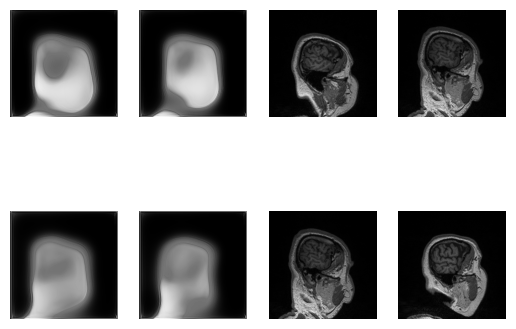

7800/200000
Discriminator Loss: 7.116190373870688e-07
Encoding Loss: 232.5927276611328	Decoding Loss: -83978.4765625
VAE ELBo: 1297.6654236778845
VAEGAN Loss: 1299.1865584935897
Encoder grads: 89.17210388183594	Decoder grads: -0.014669738709926605
Discriminator grads: -0.009702282957732677
Decoded Images MEAN: 0.29783955216407776	STD: 0.359067440032959


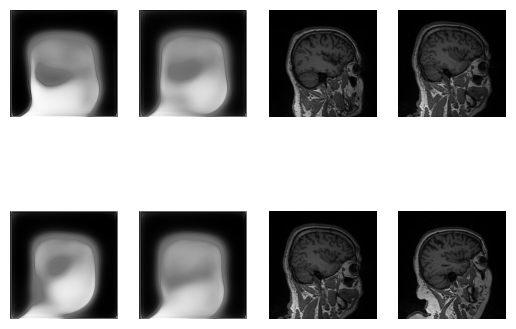

7900/200000
Discriminator Loss: 3.1513354171485983e-07
Encoding Loss: 247.75706481933594	Decoding Loss: -84787.4921875
VAE ELBo: 635.0848506724684
VAEGAN Loss: 635.8359137658227
Encoder grads: 71.34101867675781	Decoder grads: 0.012087129056453705
Discriminator grads: -0.009380304254591465
Decoded Images MEAN: 0.3008200526237488	STD: 0.39370861649513245


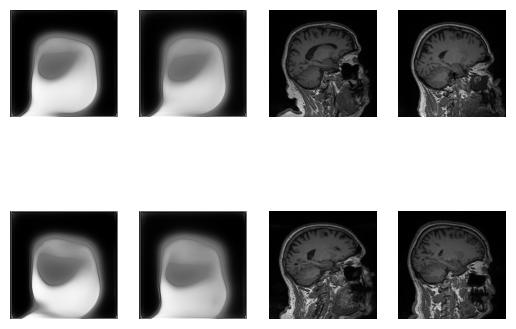

8000/200000
Discriminator Loss: 8.187455391635012e-07
Encoding Loss: 1401.509521484375	Decoding Loss: -83177.1328125
VAE ELBo: 1677.9949873046876
VAEGAN Loss: 1679.9734931640626
Encoder grads: 817.280029296875	Decoder grads: 0.1500762403011322
Discriminator grads: -0.004959920886904001
Decoded Images MEAN: 0.21360354125499725	STD: 0.39378711581230164


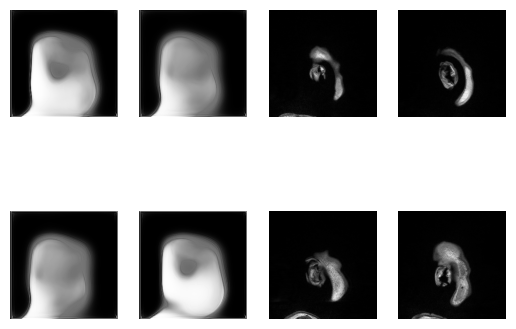

8100/200000
Discriminator Loss: 4.6691217802516705e-07
Encoding Loss: 273.1847839355469	Decoding Loss: -84338.3828125
VAE ELBo: 1038.9969232253086
VAEGAN Loss: 1040.218732638889
Encoder grads: 61.85309600830078	Decoder grads: 0.009485268034040928
Discriminator grads: -0.007694069761782885
Decoded Images MEAN: 0.30744320154190063	STD: 0.3748677372932434


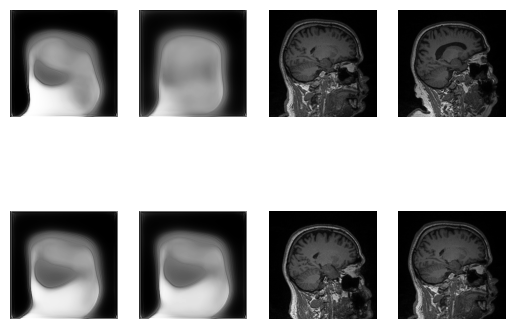

8200/200000
Discriminator Loss: 1.6251649069046124e-07
Encoding Loss: 248.6063995361328	Decoding Loss: -84161.765625
VAE ELBo: 403.4794131097561
VAEGAN Loss: 403.9621855945122
Encoder grads: -39.62283706665039	Decoder grads: 0.016134975478053093
Discriminator grads: -0.010845583863556385
Decoded Images MEAN: 0.2973712384700775	STD: 0.3704090714454651


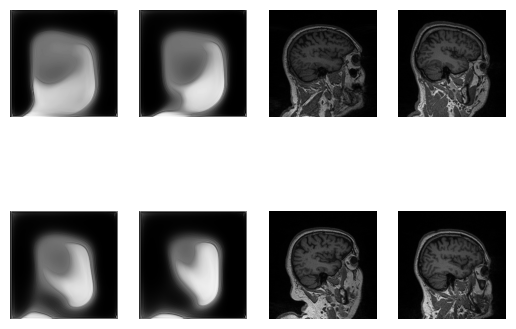

8300/200000
Discriminator Loss: 5.669919281275045e-07
Encoding Loss: 293.5334167480469	Decoding Loss: -82438.1171875
VAE ELBo: 1416.4443175828312
VAEGAN Loss: 1418.114501129518
Encoder grads: 78.42424011230469	Decoder grads: -0.0379062294960022
Discriminator grads: -0.01325393095612526
Decoded Images MEAN: 0.3035714328289032	STD: 0.3914540410041809


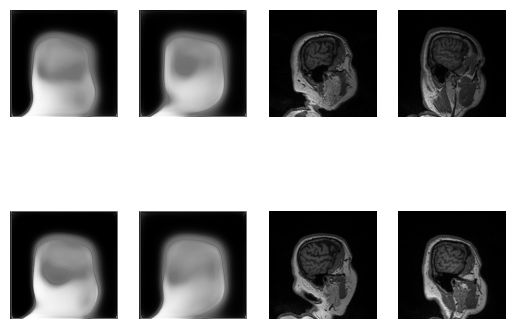

8400/200000
Discriminator Loss: 2.910623026677751e-07
Encoding Loss: 299.64239501953125	Decoding Loss: -84515.4609375
VAE ELBo: 798.774453125
VAEGAN Loss: 799.71775390625
Encoder grads: -4.926881313323975	Decoder grads: 0.008485207334160805
Discriminator grads: -0.0054726069793105125
Decoded Images MEAN: 0.23164896667003632	STD: 0.329695463180542


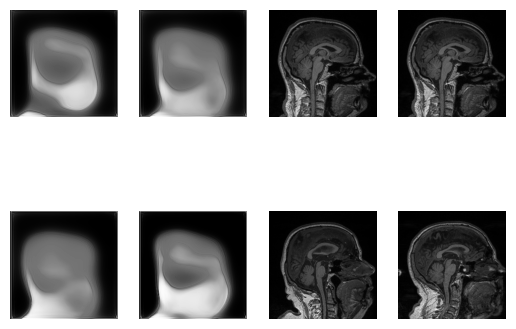

8500/200000
Discriminator Loss: 6.180608205100083e-08
Encoding Loss: 375.9488220214844	Decoding Loss: -81886.7109375
VAE ELBo: 192.861
VAEGAN Loss: 193.09407352941176
Encoder grads: -16.02638053894043	Decoder grads: 0.03666596859693527
Discriminator grads: -0.008255377411842346
Decoded Images MEAN: 0.2613382339477539	STD: 0.3880753219127655


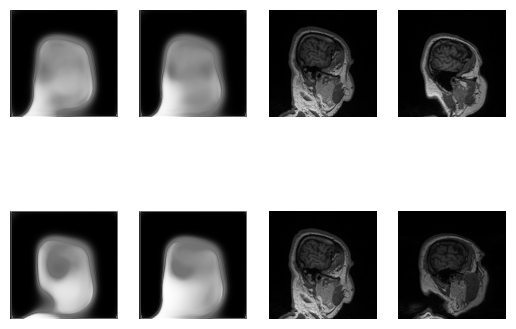

8600/200000
Discriminator Loss: 3.8045794839448254e-07
Encoding Loss: 213.19326782226562	Decoding Loss: -83554.015625
VAE ELBo: 1173.5089507630814
VAEGAN Loss: 1174.8918377543605
Encoder grads: 44.51752471923828	Decoder grads: -0.010171739384531975
Discriminator grads: -0.007123978808522224
Decoded Images MEAN: 0.2984090745449066	STD: 0.3729819059371948


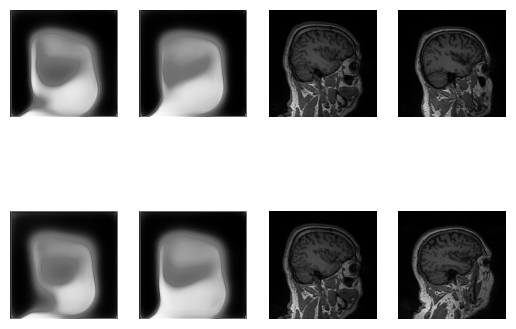

8700/200000
Discriminator Loss: 1.666209276266471e-07
Encoding Loss: 270.21539306640625	Decoding Loss: -84781.6953125
VAE ELBo: 577.2284060704023
VAEGAN Loss: 577.9120141882183
Encoder grads: 2.97310209274292	Decoder grads: -0.01179925724864006
Discriminator grads: -0.005576425697654486
Decoded Images MEAN: 0.27687135338783264	STD: 0.35725274682044983


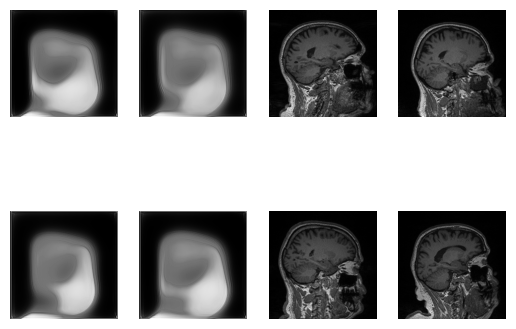

8800/200000
Discriminator Loss: 4.347916503568492e-07
Encoding Loss: 778.7111206054688	Decoding Loss: -83211.6640625
VAE ELBo: 1523.4017427201704
VAEGAN Loss: 1525.2044469105113
Encoder grads: 105.08062744140625	Decoder grads: 0.03933276981115341
Discriminator grads: -0.0035924443509429693
Decoded Images MEAN: 0.2158282846212387	STD: 0.3966924846172333


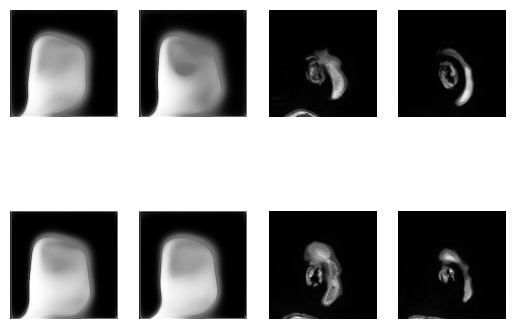

8900/200000
Discriminator Loss: 2.472985532508216e-07
Encoding Loss: 174.62364196777344	Decoding Loss: -84425.6640625
VAE ELBo: 948.2123893960675
VAEGAN Loss: 949.3268591994382
Encoder grads: 10.686600685119629	Decoder grads: 0.023967072367668152
Discriminator grads: -0.0054491544142365456
Decoded Images MEAN: 0.2836766242980957	STD: 0.3560918867588043


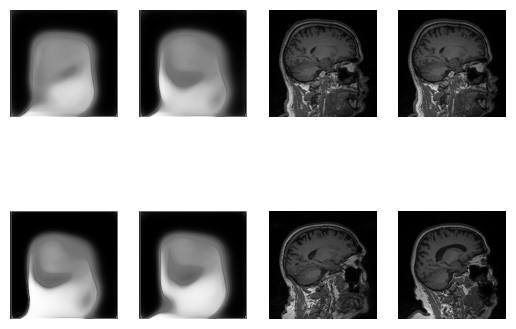

9000/200000
Discriminator Loss: 8.521012528540774e-08
Encoding Loss: 177.79754638671875	Decoding Loss: -84000.2421875
VAE ELBo: 367.6200321180556
VAEGAN Loss: 368.06084461805557
Encoder grads: -96.23422241210938	Decoder grads: -0.0018903589807450771
Discriminator grads: -0.007577215787023306
Decoded Images MEAN: 0.2875524163246155	STD: 0.3773784339427948


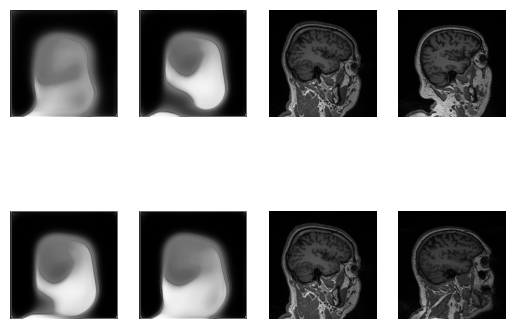

9100/200000
Discriminator Loss: 2.986504667925336e-07
Encoding Loss: 244.2089385986328	Decoding Loss: -82176.0390625
VAE ELBo: 1290.405967548077
VAEGAN Loss: 1291.9326699862638
Encoder grads: 67.70035552978516	Decoder grads: -0.007980862632393837
Discriminator grads: -0.008743629790842533
Decoded Images MEAN: 0.29598313570022583	STD: 0.38785868883132935


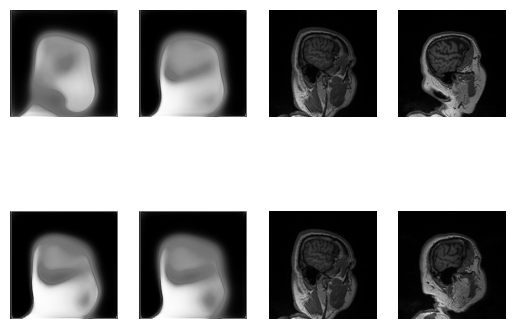

9200/200000
Discriminator Loss: 1.5187856483269412e-07
Encoding Loss: 294.5851135253906	Decoding Loss: -84437.171875
VAE ELBo: 727.3773378057065
VAEGAN Loss: 728.2405154551631
Encoder grads: -20.475589752197266	Decoder grads: -0.04108068346977234
Discriminator grads: -0.0039183953776955605
Decoded Images MEAN: 0.23936155438423157	STD: 0.3340051770210266


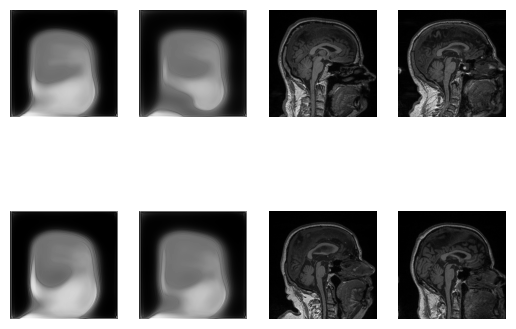

9300/200000
Discriminator Loss: 3.179696436110203e-08
Encoding Loss: 332.94696044921875	Decoding Loss: -81440.59375
VAE ELBo: 174.96091733870966
VAEGAN Loss: 175.1743766801075
Encoder grads: -5.133819580078125	Decoder grads: 0.07049985975027084
Discriminator grads: -0.006479044910520315
Decoded Images MEAN: 0.2617177963256836	STD: 0.3934006989002228


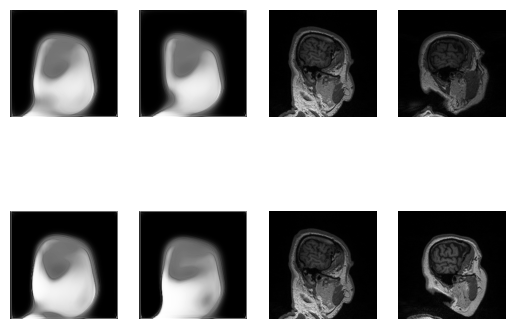

9400/200000
Discriminator Loss: 1.9678563332606845e-07
Encoding Loss: 174.37867736816406	Decoding Loss: -83407.265625
VAE ELBo: 1070.0413804853724
VAEGAN Loss: 1071.3093500664893
Encoder grads: 55.509002685546875	Decoder grads: -0.005897819064557552
Discriminator grads: -0.004974751733243465
Decoded Images MEAN: 0.2998236119747162	STD: 0.3681532144546509


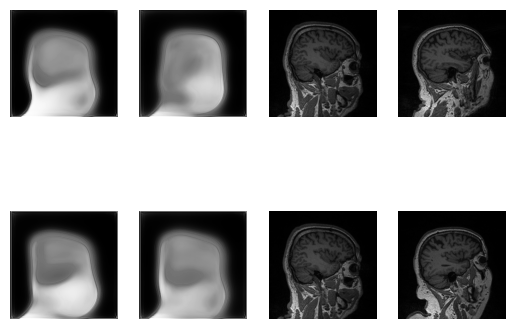

9500/200000
Discriminator Loss: 8.53351595747211e-08
Encoding Loss: 195.65127563476562	Decoding Loss: -84511.5234375
VAE ELBo: 524.6757672697369
VAEGAN Loss: 525.3031685855264
Encoder grads: 90.78510284423828	Decoder grads: -0.04327300935983658
Discriminator grads: -0.0039743888191878796
Decoded Images MEAN: 0.2893141210079193	STD: 0.3607259690761566


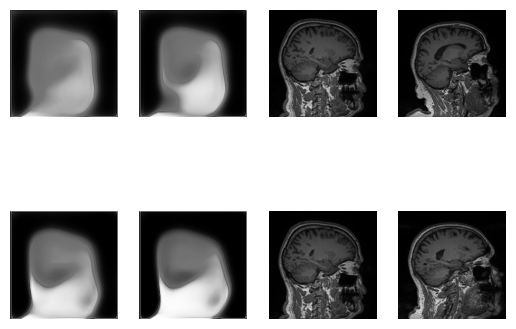

9600/200000
Discriminator Loss: 2.2284379781467577e-07
Encoding Loss: 1118.9930419921875	Decoding Loss: -82007.609375
VAE ELBo: 1389.4476163736979
VAEGAN Loss: 1391.1036824544271
Encoder grads: 565.2269897460938	Decoder grads: -0.007666401565074921
Discriminator grads: -0.001873236964456737
Decoded Images MEAN: 0.17331765592098236	STD: 0.3689955472946167


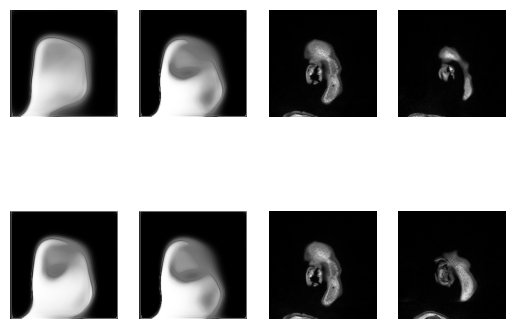

9700/200000
Discriminator Loss: 1.2552425640436565e-07
Encoding Loss: 192.8157958984375	Decoding Loss: -84226.6875
VAE ELBo: 863.8486509342783
VAEGAN Loss: 864.8733609858248
Encoder grads: 37.604949951171875	Decoder grads: -0.03802841156721115
Discriminator grads: -0.0041833664290606976
Decoded Images MEAN: 0.300083726644516	STD: 0.36102357506752014


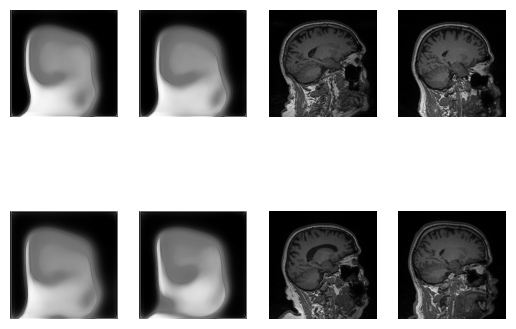

9800/200000
Discriminator Loss: 4.267437602999164e-08
Encoding Loss: 204.5105438232422	Decoding Loss: -83787.4140625
VAE ELBo: 335.9599426020408
VAEGAN Loss: 336.36562420280615
Encoder grads: -55.60325622558594	Decoder grads: 0.05705302953720093
Discriminator grads: -0.004953152034431696
Decoded Images MEAN: 0.2946406304836273	STD: 0.3710308074951172


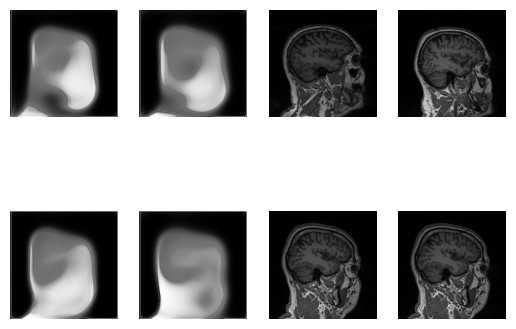

9900/200000
Discriminator Loss: 1.4990415825241604e-07
Encoding Loss: 235.0886688232422	Decoding Loss: -82022.4296875
VAE ELBo: 1182.6941477272728
VAEGAN Loss: 1184.1002943497474
Encoder grads: 36.34077835083008	Decoder grads: 0.0013692686334252357
Discriminator grads: -0.005604753270745277
Decoded Images MEAN: 0.28843995928764343	STD: 0.38241904973983765


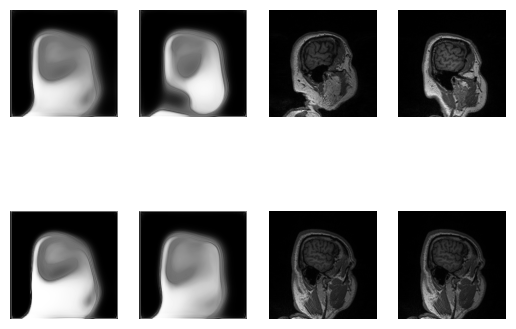

10000/200000
Discriminator Loss: 7.602325958941946e-08
Encoding Loss: 253.74722290039062	Decoding Loss: -84579.7578125
VAE ELBo: 672.10590546875
VAEGAN Loss: 672.9014640625
Encoder grads: -77.96070861816406	Decoder grads: -0.01811421662569046
Discriminator grads: -0.0028320634737610817
Decoded Images MEAN: 0.2401641458272934	STD: 0.3314339816570282


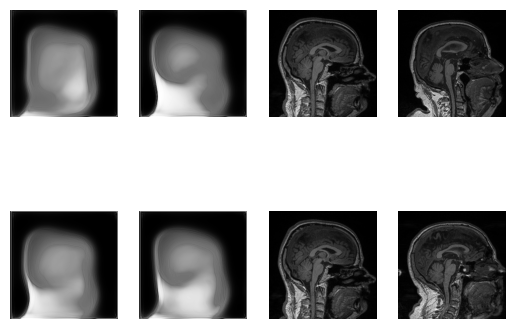

10100/200000
Discriminator Loss: 1.5526051410602976e-08
Encoding Loss: 277.47412109375	Decoding Loss: -82605.2265625
VAE ELBo: 161.84828666460396
VAEGAN Loss: 162.04523824257427
Encoder grads: 99.51216888427734	Decoder grads: -0.05917085334658623
Discriminator grads: -0.0053861504420638084
Decoded Images MEAN: 0.31212589144706726	STD: 0.43097278475761414


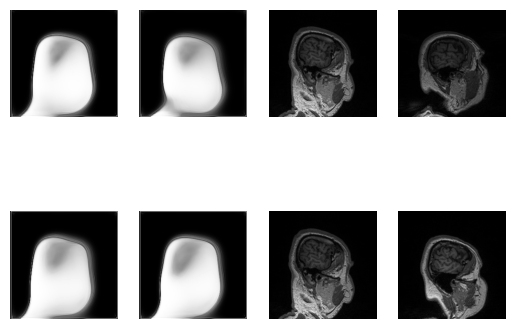

In [ ]:
# VAEGAN (ROBUST)

while iter < ITERATIONS:

    discriminator_image_loss = 0.0
    discriminator_sequence_loss = 0.0
    elbo_loss = 0.0
    vae_total_loss = 0.0

    for item, images in enumerate(dataloader): # (Batch, 160, 256, 256)

        for frame in range(images.size(1)):

            iter += 1

            real_images = images[:, frame].unsqueeze(1).to(device) # (Batch, 1, 256, 256)

            image_discriminator.zero_grad()

            real_label = torch.full((real_images.size(0), real_images.size(1), real_images.size(2), real_images.size(3)), 1, dtype=torch.float, device=device)
            fake_label = torch.full((real_images.size(0), real_images.size(1), real_images.size(2), real_images.size(3)), 0, dtype=torch.float, device=device)

            noise = torch.randn((real_images.size(0), 128), device=device)

            with torch.no_grad():

                fake_images = decoder(noise)

            real_output = image_discriminator(real_images)
            fake_output = image_discriminator(fake_images)

            discriminator_img_loss = bce(real_output, real_label) + bce(fake_output, fake_label)

            discriminator_img_loss.backward()

            discriminator_image_loss += discriminator_img_loss.item()

            optimizer_image.step()

            encoder.zero_grad()
            decoder.zero_grad()

            mean, std = encoder(real_images)

            std = torch.exp(std/2)
            q = torch.distributions.Normal(mean, std)
            z = q.rsample()

            decoded_images = decoder(z)

            encoding_loss = kl_divergence(z, mean, std)
            decoding_loss = gaussian_likelihood(decoded_images, decoder.scale, real_images)

            elbo = encoding_loss - decoding_loss
            elbo = elbo.mean()

            elbo_loss += elbo.item()

            output_fake = image_discriminator(decoded_images)

            adversarial_loss = bce(output_fake, real_label)

            vae_loss = elbo + adversarial_loss
            vae_loss.backward()

            vae_total_loss += vae_loss.item()

            optimizere.step()
            optimizerd.step()

            if iter % 100 == 0:

                print(f"{iter}/{ITERATIONS}")
                print(f"Discriminator Loss: {discriminator_image_loss/iter}")
                print(f"Encoding Loss: {encoding_loss.mean().item()}\tDecoding Loss: {decoding_loss.mean().item()}")
                print(f"VAE ELBo: {elbo_loss/iter}")
                print(f"VAEGAN Loss: {vae_total_loss/iter}")
                #print(f"Encoder grads: {torch.mean(encoder.neuron1.weight.grad)}\tDecoder grads: {torch.mean(decoder.neuron1.weight.grad)}")
                print(f"Encoder grads: {torch.mean(encoder.conv1.weight.grad)}\tDecoder grads: {torch.mean(decoder.transconv1.weight.grad)}")
                print(f"Discriminator grads: {torch.mean(image_discriminator.conv1A.weight.grad)}")
                print(f"Decoded Images MEAN: {decoded_images.detach().mean()}\tSTD: {decoded_images.detach().std()}")

                with torch.no_grad():

                    input_noise = torch.randn_like(z)

                    saving_image = decoder(input_noise).cpu()

                saving_image = saving_image.permute((0, 2, 3, 1))
                saving_image = saving_image.cpu().numpy()
                #saving_image = (saving_image * STD) + MEAN # Denormalized with scaling [-1, 1] --> Already within [0, 1]
                #saving_image = (saving_image + 1.0) * 0.5 # For matplotlib, floats [0, 1]

                original_image = real_images.cpu()
                original_image = original_image.permute((0, 2, 3, 1))
                original_image = original_image.numpy()

                fig, ax = plt.subplots(2,4)

                for x in range(ax.shape[0]):
                    for y in range(ax.shape[1]):
                        ax[x,y].axis('off')

                ax[0,0].imshow(saving_image[0], cmap='gray')
                ax[1,0].imshow(saving_image[1], cmap='gray')
                ax[0,1].imshow(saving_image[2], cmap='gray')
                ax[1,1].imshow(saving_image[3], cmap='gray')
                ax[0,2].imshow(original_image[0], cmap='gray')
                ax[0,3].imshow(original_image[1], cmap='gray')
                ax[1,2].imshow(original_image[2], cmap='gray')
                ax[1,3].imshow(original_image[3], cmap='gray')
                plt.show()

                torch.save({
                    'iter': iter,
                    'Encoder_weights': encoder.state_dict(),
                    'Decoder_weights': decoder.state_dict(),
                    'Discriminator_weights': image_discriminator.state_dict()
                }, '/content/drive/MyDrive/Colab Notebooks/VAEGAN_parameters.tar')

            if iter >= ITERATIONS:

                break

In [ ]:
# VAEGAN (ROBUST)

while iter < ITERATIONS:

    discriminator_image_loss = 0.0
    discriminator_sequence_loss = 0.0
    elbo_loss = 0.0
    vae_total_loss = 0.0

    for item, images in enumerate(dataloader): # (Batch, 160, 256, 256)

        iter += 1

        real_images = images.to(device)

        image_discriminator.zero_grad()
        #fps_discriminator.zero_grad()

        #real_label_fps = torch.full((real_images.size(0), 1), 1, dtype=torch.float, device=device)
        #fake_label_fps = torch.full((real_images.size(0), 1), 0, dtype=torch.float, device=device)
        real_label = torch.full((real_images.size(0), real_images.size(1), real_images.size(2), real_images.size(3)), 1, dtype=torch.float, device=device)
        fake_label = torch.full((real_images.size(0), real_images.size(1), real_images.size(2), real_images.size(3)), 0, dtype=torch.float, device=device)

        '''real_fps = fps_discriminator(real_images) # (Batch, 1)

        noise = [torch.randn((real_images.size(0), 128), device=device) for x in range(160)]

        fake_images = []

        for i in range(len(noise)):

            with torch.no_grad():

                generated_image = decoder(noise[i]) # (Batch, 1, 256, 256)
                fake_images.append(generated_image)

        fake_images = torch.cat(fake_images, 0)

        fake_fps = fps_discriminator(fake_images)

        discriminator_fps_loss = bce(real_fps, real_label_fps) + bce(fake_fps, fake_label_fps)

        discriminator_fps_loss.backward()

        discriminator_sequence_loss += discriminator_fps_loss.item()

        optimizer_fps.step()'''

        noise = [torch.randn((real_images.size(0), 128), device=device) for x in range(160)]

        fake_images = []

        for i in range(len(noise)):

            with torch.no_grad():

                generated_image = decoder(noise[i]) # (Batch, 1, 256, 256)
                fake_images.append(generated_image)

        fake_images = torch.cat(fake_images, 0)

        for i in range(real_images.size(1)):

            real_output = image_discriminator(real_images[:, i].unsqueeze(1)) # (Batch, 1, 256, 256)
            fake_output = image_discriminator(fake_images[i])

            discriminator_img_loss = bce(real_output, real_label) + bce(fake_output, fake_label)

            discriminator_img_loss.backward()

            discriminator_image_loss += discriminator_img_loss.item()

        optimizer_image.step()

        encoder.zero_grad()
        decoder.zero_grad()

        for i in range(real_images.size(1)):

            e

        latent_spaces = encoder(real_images)

        latent_vectors = []
        encoding_losses = []

        for i in range(len(latent_spaces)):

            mean = latent_spaces[i][0]
            std = latent_spaces[i][1]
            std = torch.exp(std/2)
            q = torch.distributions.Normal(mean, std)
            z = q.rsample()

            encoding_loss = kl_divergence(z, mean, std)
            encoding_losses.append(encoding_loss)

            decoded_images = decoder(z)

            decoding_loss = gaussian_likelihood(decoded_images, decoder.scale, real_images[:, i])

            latent_vectors.append(z)

        mean, std = encoder(real_images)

        std = torch.exp(std/2)
        q = torch.distributions.Normal(mean, std)
        z = q.rsample()

        decoded_images = decoder(z)

        encoding_loss = kl_divergence(z, mean, std)
        decoding_loss = gaussian_likelihood(decoded_images, decoder.scale, real_images)

        elbo = encoding_loss - decoding_loss
        elbo = elbo.mean()

        elbo_loss += elbo.item()

        output_fake, _ = discriminator(decoded_images)

        adversarial_loss = bce(output_fake, real_label)

        vae_loss = elbo + adversarial_loss
        vae_loss.backward()

        vae_total_loss += vae_loss.item()

        optimizere.step()
        optimizerd.step()

        if iter % 100 == 0:

            print(f"{iter}/{ITERATIONS}")
            print(f"Discriminator Loss: {discriminator_total_loss/iter}")
            print(f"Encoding Loss: {encoding_loss.mean().item()}\tDecoding Loss: {decoding_loss.mean().item()}")
            print(f"VAE ELBo: {elbo_loss/iter}")
            print(f"VAEGAN Loss: {vae_total_loss/iter}")
            #print(f"Encoder grads: {torch.mean(encoder.neuron1.weight.grad)}\tDecoder grads: {torch.mean(decoder.neuron1.weight.grad)}")
            print(f"Encoder grads: {torch.mean(encoder.conv1.weight.grad)}\tDecoder grads: {torch.mean(decoder.transconv1.weight.grad)}")
            print(f"Discriminator grads: {torch.mean(discriminator.conv1A.weight.grad)}")
            print(f"Decoded Images MEAN: {decoded_images.detach().mean()}\tSTD: {decoded_images.detach().std()}")
            print(f"Dataset MEAN: {MEAN}\tSTD: {STD}")

            with torch.no_grad():

                input_noise = torch.randn_like(z)

                saving_image = decoder(input_noise).cpu()

            saving_image = saving_image.permute((0, 2, 3, 1))
            saving_image = saving_image.cpu().numpy()
            #saving_image = (saving_image * STD) + MEAN # Denormalized with scaling [-1, 1] --> Already within [0, 1]
            #saving_image = (saving_image + 1.0) * 0.5 # For matplotlib, floats [0, 1]

            original_image = real_images.cpu()
            original_image = original_image.permute((0, 2, 3, 1))
            original_image = original_image.numpy()

            fig, ax = plt.subplots(2,4)

            for x in range(ax.shape[0]):
                for y in range(ax.shape[1]):
                    ax[x,y].axis('off')

            ax[0,0].imshow(saving_image[0], cmap='gray')
            ax[1,0].imshow(saving_image[1], cmap='gray')
            ax[0,1].imshow(saving_image[2], cmap='gray')
            ax[1,1].imshow(saving_image[3], cmap='gray')
            ax[0,2].imshow(original_image[0], cmap='gray')
            ax[0,3].imshow(original_image[1], cmap='gray')
            ax[1,2].imshow(original_image[2], cmap='gray')
            ax[1,3].imshow(original_image[3], cmap='gray')
            plt.show()

            torch.save({
                'iter': iter,
                'Encoder_weights': encoder.state_dict(),
                'Decoder_weights': decoder.state_dict(),
                'Discriminator_weights': discriminator.state_dict()
            }, '/content/drive/MyDrive/Colab Notebooks/VAEGAN_parameters.tar')

        if iter >= ITERATIONS:

            break